# 1.分类诊断

In [24]:
data = pd.read_excel('./results/after preprocessing-classification.xlsx')  

In [25]:


numeric_cols = ['reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'RPM', 'span in corsi block test', 'accuracy in corsi block test', 'Age', 'Education years', 'BMI', 'SES','Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor']

categorical_cols = ['Sex', 'Ethnic', 'Residence', 'Only child', 'Smoking status', 'Alcohol consumption', 'Employed', 'Marital status']

In [27]:
import pandas as pd
from scipy.stats import ttest_ind, sem, t
from numpy import sqrt
import numpy as np

def cohens_d(group1, group2):
    """
    Compute Cohen's d.
    
    group1: Series or NumPy array
    group2: Series or NumPy array
    
    returns a float (Cohen's d)
    """
    diff = group1.mean() - group2.mean()

    n1, n2 = len(group1), len(group2)
    var1 = group1.var()
    var2 = group2.var()

    pooled_var = (n1 * var1 + n2 * var2) / (n1 + n2)

    d = diff / sqrt(pooled_var)
    
    return d

def independent_t_confidence_interval(data1, data2, confidence=0.95):
    """
    Calculate the confidence interval for the difference in means of two independent samples.

    data1, data2: The two samples for which the confidence interval is to be calculated.
    confidence: The confidence level for the interval.

    returns: A tuple containing the lower and upper bounds of the confidence interval.
    """
    mean1, mean2 = np.mean(data1), np.mean(data2)
    sem1, sem2 = sem(data1), sem(data2)
    sed = sqrt(sem1**2.0 + sem2**2.0)
    t_crit = t.ppf((1 + confidence) / 2, df=len(data1)+len(data2)-2)
    margin_of_error = t_crit * sed
    return (mean1 - mean2 - margin_of_error, mean1 - mean2 + margin_of_error)


results_df = pd.DataFrame(columns=['Variable', 'SCZ Mean', 'SCZ Std Dev', 'HC Mean', 'HC Std Dev', 't', 'p', 'Cohen\'s d', '95% CI Lower', '95% CI Upper'])

# Ensure that 'numeric_cols' and 'df' are defined in your context
for col in numeric_cols:
    scz = df[df['Group'] == 1][col]
    hc = df[df['Group'] == 2][col]
    
    t_stat, p_val = ttest_ind(scz, hc)
    
    d = cohens_d(scz, hc)
    ci_lower, ci_upper = independent_t_confidence_interval(scz, hc)
    
    if p_val < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_val:.3f}"
    
    print(f'Variable {col}:\nSCZ group mean±std dev = {scz.mean():.2f} ± {scz.std():.2f}\n'
          f'HC group mean±std dev = {hc.mean():.2f} ± {hc.std():.2f}\n'
          f't = {t_stat:.3f}, {p_val_str}, Cohen\'s d = {d:.3f}, 95% CI = [{ci_lower:.3f}, {ci_upper:.3f}]\n')
    
    new_row = pd.DataFrame({
        'Variable': [col],
        'SCZ Mean': [scz.mean()],
        'SCZ Std Dev': [scz.std()],
        'HC Mean': [hc.mean()],
        'HC Std Dev': [hc.std()],
        't': [t_stat],
        'p': [p_val_str],
        'Cohen\'s d': [d],
        '95% CI Lower': [ci_lower],
        '95% CI Upper': [ci_upper]
    })

    results_df = pd.concat([results_df, new_row], ignore_index=True)

results_df.to_excel('./results/195名患者组与169名对照组连续变量t检验结果.xlsx', index=False)

Variable reaction times in incongruent stimuli:
SCZ group mean±std dev = 751.79 ± 148.77
HC group mean±std dev = 663.61 ± 149.02
t = 5.636, p < 0.001, Cohen's d = 0.592, 95% CI = [57.406, 118.955]

Variable reaction times in congruent stimuli:
SCZ group mean±std dev = 704.26 ± 132.24
HC group mean±std dev = 604.55 ± 118.40
t = 7.530, p < 0.001, Cohen's d = 0.791, 95% CI = [73.875, 125.552]

Variable reaction times in neutral stimuli:
SCZ group mean±std dev = 727.27 ± 147.34
HC group mean±std dev = 611.64 ± 114.15
t = 8.274, p < 0.001, Cohen's d = 0.870, 95% CI = [88.639, 142.629]

Variable stroop interference effect:
SCZ group mean±std dev = -23.01 ± 73.67
HC group mean±std dev = -7.09 ± 44.24
t = -2.452, p = 0.015, Cohen's d = -0.258, 95% CI = [-28.266, -3.575]

Variable accuracy in Go trials:
SCZ group mean±std dev = 0.83 ± 0.14
HC group mean±std dev = 0.94 ± 0.08
t = -8.963, p < 0.001, Cohen's d = -0.942, 95% CI = [-0.133, -0.086]

Variable reaction times in Go trials:
SCZ group mea

In [28]:
from scipy.stats import chi2_contingency
import numpy as np

results = []

results_df = pd.DataFrame(columns=['Variable', 'SCZ Counts', 'SCZ Percentages', 'HC Counts', 'HC Percentages', 'Chi2', 'p', 'Cramer\'s V'])

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))



for col in categorical_cols:
    contingency_table = pd.crosstab(df['Group'], df[col])
    
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    n1 = df[df['Group'] == 1][col].value_counts().sort_index().values
    n2 = df[df['Group'] == 2][col].value_counts().sort_index().values
    
    scz_counts = ', '.join(map(str, n1))
    scz_percentages = ', '.join(f'{perc*100:.1f}%' for perc in n1/n1.sum())
    hc_counts = ', '.join(map(str, n2))
    hc_percentages = ', '.join(f'{perc*100:.1f}%' for perc in n2/n2.sum())
    
    cramers_v_value = cramers_v(df['Group'], df[col])
    
    if p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p:.3f}"
        

    result = pd.DataFrame({
        'Variable': [col],
        'SCZ Counts': [scz_counts],
        'SCZ Percentages': [scz_percentages],
        'HC Counts': [hc_counts],
        'HC Percentages': [hc_percentages],
        'Chi2': [chi2],
        'p': [p_val_str],
        'Cramer\'s V': [cramers_v_value]
    })

    results.append(result)

results_df = pd.concat(results, ignore_index=True)

results_df.to_excel('./results/195名患者组与169名对照组分类变量卡方检验结果.xlsx', index=False)

In [29]:
data = pd.read_excel('./results/after preprocessing-classification.xlsx')  

In [31]:
import pandas as pd
from scipy.stats import ttest_ind, sem, t
from numpy import sqrt
import numpy as np

def cohens_d(group1, group2):
    """
    Compute Cohen's d.
    
    group1: Series or NumPy array
    group2: Series or NumPy array
    
    returns a float (Cohen's d)
    """
    diff = group1.mean() - group2.mean()

    n1, n2 = len(group1), len(group2)
    var1 = group1.var()
    var2 = group2.var()

    pooled_var = (n1 * var1 + n2 * var2) / (n1 + n2)

    d = diff / sqrt(pooled_var)
    
    return d

def independent_t_confidence_interval(data1, data2, confidence=0.95):
    """
    Calculate the confidence interval for the difference in means of two independent samples.

    data1, data2: The two samples for which the confidence interval is to be calculated.
    confidence: The confidence level for the interval.

    returns: A tuple containing the lower and upper bounds of the confidence interval.
    """
    mean1, mean2 = np.mean(data1), np.mean(data2)
    sem1, sem2 = sem(data1), sem(data2)
    sed = sqrt(sem1**2.0 + sem2**2.0)
    t_crit = t.ppf((1 + confidence) / 2, df=len(data1)+len(data2)-2)
    margin_of_error = t_crit * sed
    return (mean1 - mean2 - margin_of_error, mean1 - mean2 + margin_of_error)


results_df = pd.DataFrame(columns=['Variable', 'SCZ Mean', 'SCZ Std Dev', 'HC Mean', 'HC Std Dev', 't', 'p', 'Cohen\'s d', '95% CI Lower', '95% CI Upper'])

# Ensure that 'numeric_cols' and 'df' are defined in your context
for col in numeric_cols:
    scz = df[df['Group'] == 1][col]
    hc = df[df['Group'] == 2][col]
    
    t_stat, p_val = ttest_ind(scz, hc)
    
    d = cohens_d(scz, hc)
    ci_lower, ci_upper = independent_t_confidence_interval(scz, hc)
    
    if p_val < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_val:.3f}"
    
    print(f'Variable {col}:\nSCZ group mean±std dev = {scz.mean():.2f} ± {scz.std():.2f}\n'
          f'HC group mean±std dev = {hc.mean():.2f} ± {hc.std():.2f}\n'
          f't = {t_stat:.3f}, {p_val_str}, Cohen\'s d = {d:.3f}, 95% CI = [{ci_lower:.3f}, {ci_upper:.3f}]\n')
    
    new_row = pd.DataFrame({
        'Variable': [col],
        'SCZ Mean': [scz.mean()],
        'SCZ Std Dev': [scz.std()],
        'HC Mean': [hc.mean()],
        'HC Std Dev': [hc.std()],
        't': [t_stat],
        'p': [p_val_str],
        'Cohen\'s d': [d],
        '95% CI Lower': [ci_lower],
        '95% CI Upper': [ci_upper]
    })

    results_df = pd.concat([results_df, new_row], ignore_index=True)

results_df.to_excel('./results/195名患者组与169名对照组连续变量t检验结果-EF.xlsx', index=False)

Variable reaction times in incongruent stimuli:
SCZ group mean±std dev = 751.79 ± 148.77
HC group mean±std dev = 663.61 ± 149.02
t = 5.636, p < 0.001, Cohen's d = 0.592, 95% CI = [57.406, 118.955]

Variable reaction times in congruent stimuli:
SCZ group mean±std dev = 704.26 ± 132.24
HC group mean±std dev = 604.55 ± 118.40
t = 7.530, p < 0.001, Cohen's d = 0.791, 95% CI = [73.875, 125.552]

Variable reaction times in neutral stimuli:
SCZ group mean±std dev = 727.27 ± 147.34
HC group mean±std dev = 611.64 ± 114.15
t = 8.274, p < 0.001, Cohen's d = 0.870, 95% CI = [88.639, 142.629]

Variable stroop interference effect:
SCZ group mean±std dev = -23.01 ± 73.67
HC group mean±std dev = -7.09 ± 44.24
t = -2.452, p = 0.015, Cohen's d = -0.258, 95% CI = [-28.266, -3.575]

Variable accuracy in Go trials:
SCZ group mean±std dev = 0.83 ± 0.14
HC group mean±std dev = 0.94 ± 0.08
t = -8.963, p < 0.001, Cohen's d = -0.942, 95% CI = [-0.133, -0.086]

Variable reaction times in Go trials:
SCZ group mea

In [32]:
from statsmodels.stats.multitest import multipletests

# Extract the p-values from the results_df
p_values = results_df['p'].apply(lambda x: float(x.split('=')[-1].strip()) if '=' in x else 0.001)

# Perform FDR correction using the BH method
reject, pvals_corrected, _, _ = multipletests(p_values, method='fdr_bh')

# Update the p-values in the results_df with the corrected values
results_df['p_corrected'] = pvals_corrected.round(3)
results_df['p_corrected'] = results_df['p_corrected'].apply(lambda x: f"p < 0.001" if x < 0.001 else f"p = {x:.3f}")

# Save the updated results to a new Excel file
results_df.to_excel('./results/195名患者组与169名对照组连续变量t检验结果_FDR矫正-EF.xlsx', index=False)

## 1.4患者组之间相关分析

### 1.执行功能与PANSS四维的相关分析

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency
df = pd.read_excel('./results/after preprocessing-classification.xlsx')


data = df[df['Group'] == 1]


continuous_columns = ['PANSS Negative', 'PANSS Positive', 'PANSS Affective', 'PANSS Cognitive','reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'RPM', 'span in corsi block test', 'accuracy in corsi block test', 'Age', 'Education years', 'BMI', 'SES','Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor']

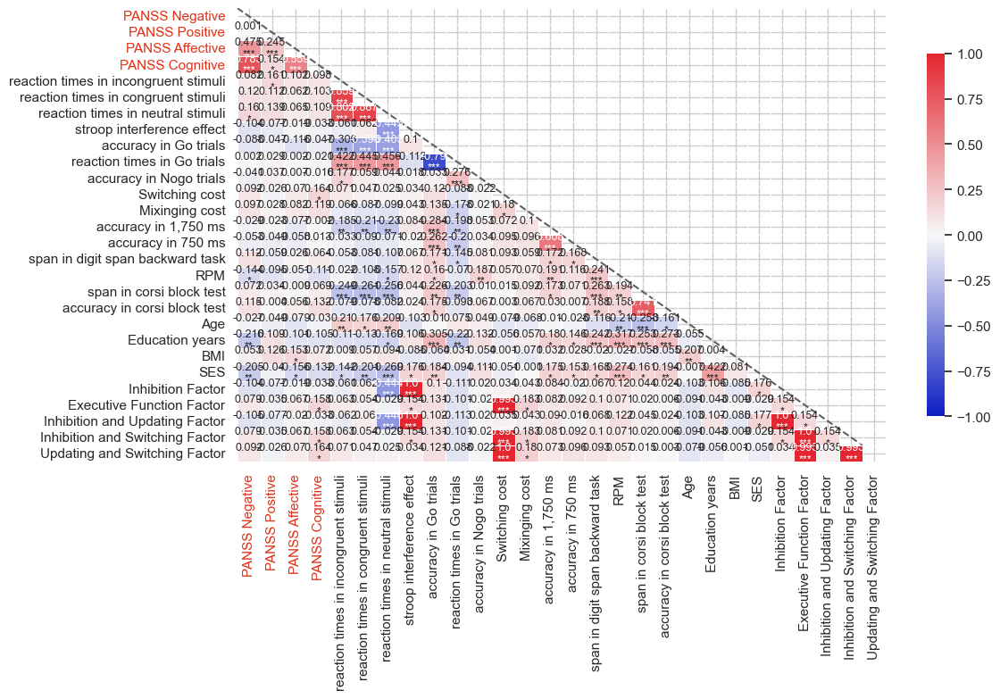

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(12, 8))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective', 'PANSS Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/预后执行功能、血液与临床的相关.png", dpi=100, bbox_inches='tight')
plt.show()

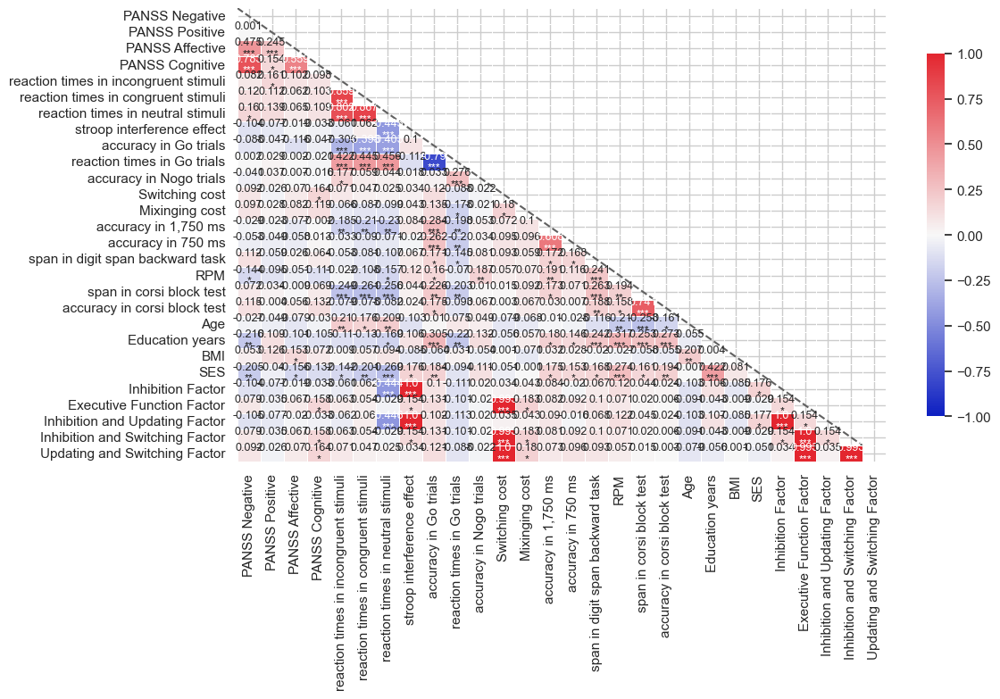

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(12, 8))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS_Negative', 'PANSS_Positive', 'PANSS_Affective', 'PANSS_Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-执行功能与PANSS四维.jpg", dpi=100, bbox_inches='tight')

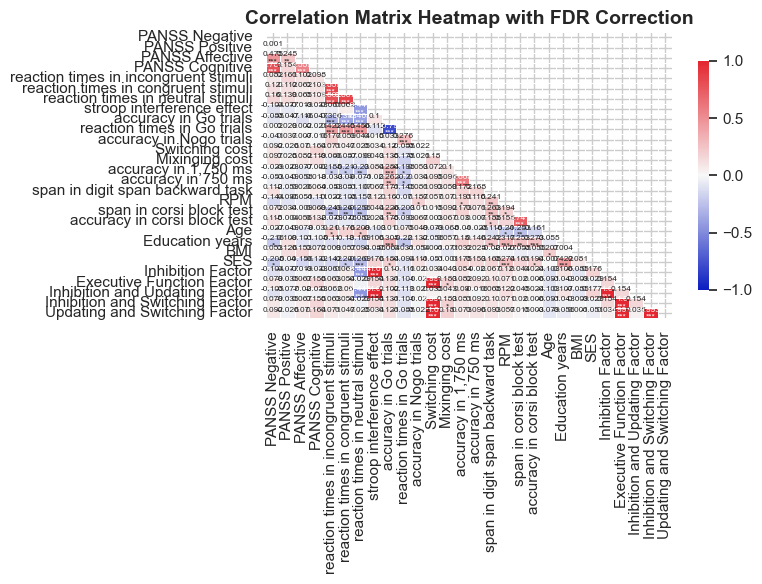

In [36]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/诊断-患者-执行功能与PANSS四维-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

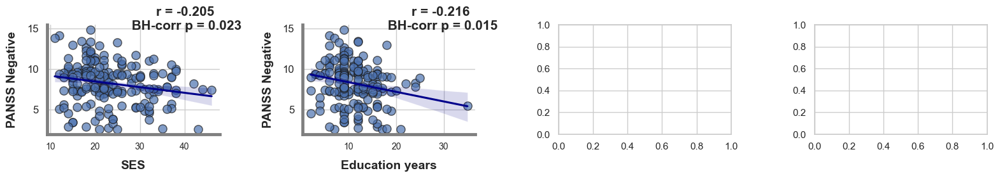

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest = ['PANSS Negative', 'PANSS Positive', 'PANSS Affective', 'PANSS Cognitive']
significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

plots_per_figure = 4 

total_plots = sum([len(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist()) for var in variables_of_interest])

significant_plot_count = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pval_corr_matrix.loc[var1, var2]

        if corrected_p < 0.05:
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-患者-社会人口与PANSS四维-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(16, 3))
                plt_idx = 0 
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = data[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(0.80, 1.05, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            
            plt_idx += 1  
            significant_plot_count += 1 

if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/诊断-患者-社会人口与PANSS四维-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

### 2.社会人口与PANSS四维

In [38]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency
df = pd.read_excel('./results/after preprocessing-classification.xlsx')

data = df[df['Group'] == 1]

continuous_columns = ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive', 'RPM',
                      'Age', 'Education years', 'BMI', 'SES']

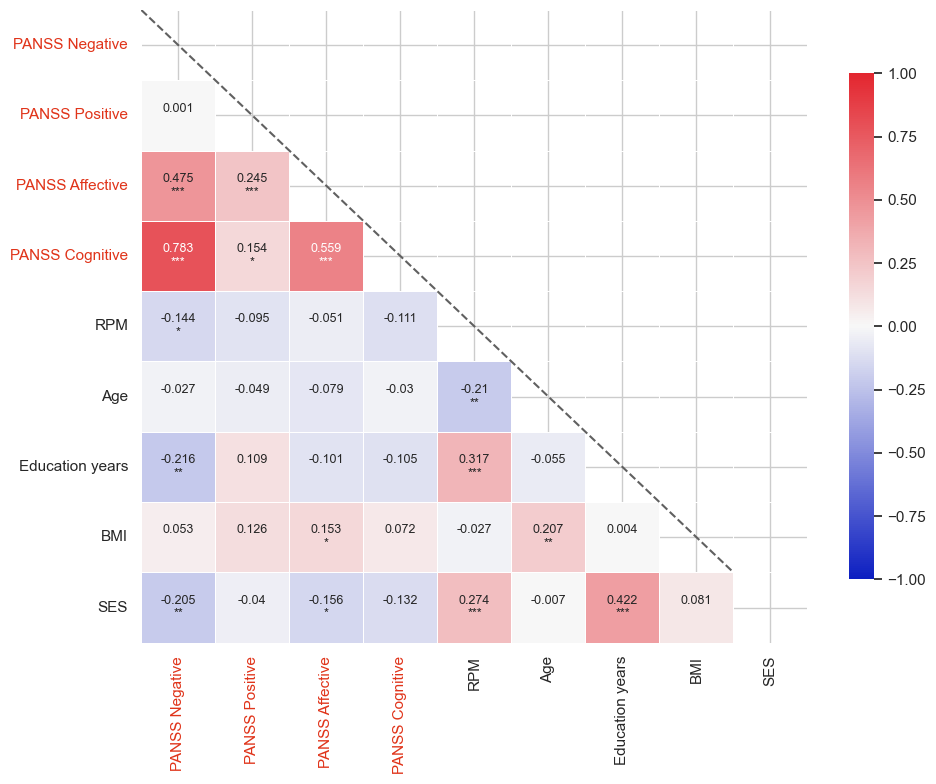

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与PANSS四维.jpg", dpi=100, bbox_inches='tight')
plt.show()

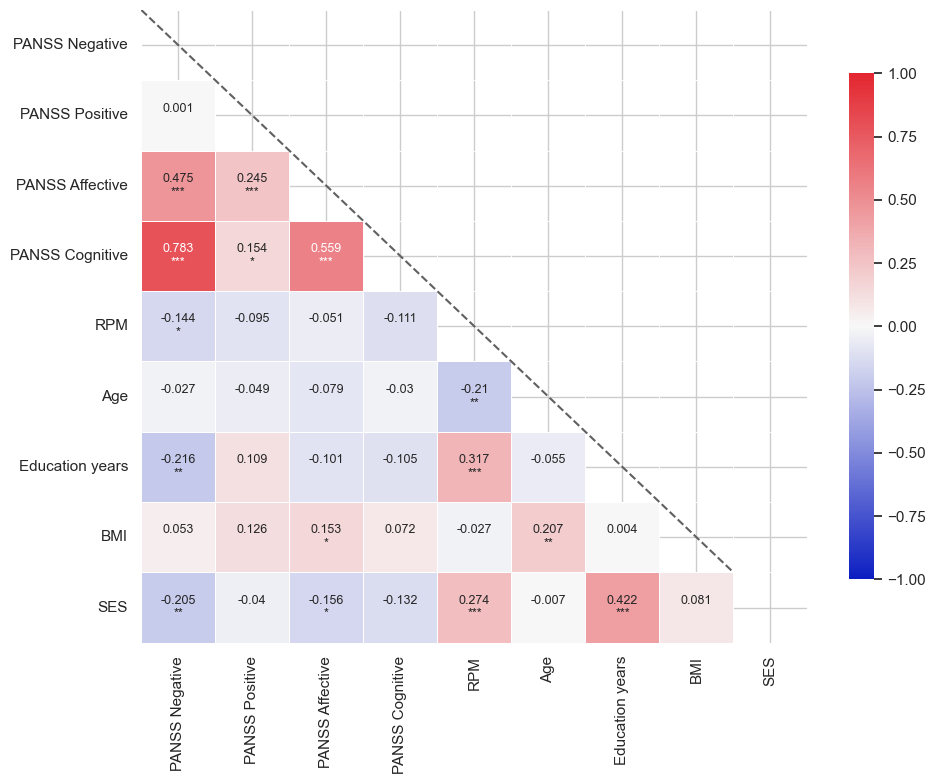

In [40]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS_Negative', 'PANSS_Positive', 'PANSS_Affective', 'PANSS_Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与PANSS四维.jpg", dpi=100, bbox_inches='tight')
plt.show()

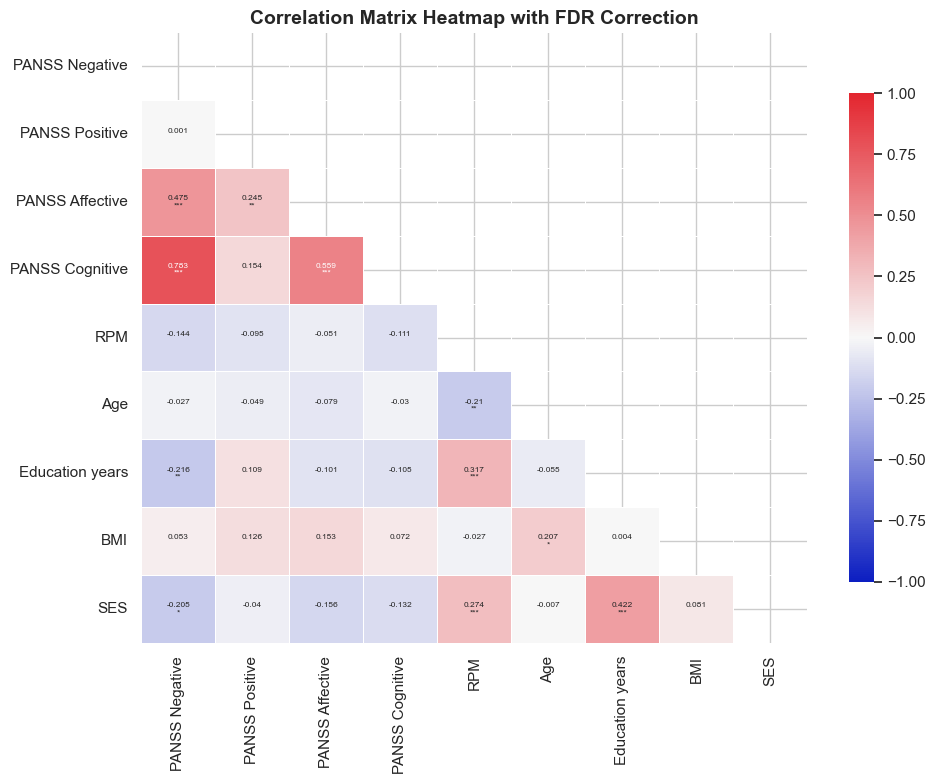

In [41]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与PANSS四维-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

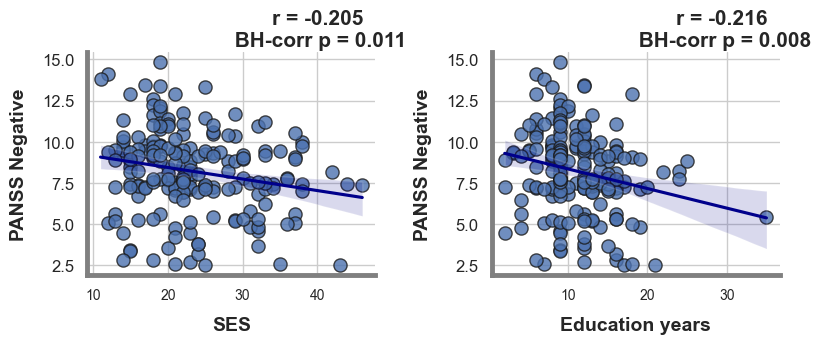

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest =  ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']


significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

num_plots = len(variables_of_interest) * len(significant_vars)
num_rows = 20

fig, axes = plt.subplots(num_rows, 4, figsize=(16, num_rows * 3.0))  
axes = axes.flatten()
plot_idx = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        paired_data = data[[var2, var1]].dropna()

        corrected_p = pval_corr_matrix.loc[var1, var2]
        if corrected_p < 0.05:
            ax = axes[plot_idx]
            plot_idx += 1
            sns.regplot(
                x=paired_data[var1], 
                y=paired_data[var2],
                scatter_kws={'alpha': 0.8, 's': 90, 'edgecolor': 'k'}, 
                line_kws={'color': 'darkblue'}, 
                ci=95,  
                ax=ax  
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2]) 
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"

            xpos = 0.80
            ypos = 1.1

            ax.text(xpos, ypos, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(f"{var1}", fontsize=14, weight='bold', labelpad=10)

            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)

            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

for i in range(plot_idx, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与PANSS四维-fdr-散点图.jpg", dpi=600, bbox_inches='tight')
plt.show()

### 3.社会人口与执行功能

In [43]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency
df = pd.read_excel('./results/after preprocessing-classification.xlsx')


data = df[df['Group'] == 1]


continuous_columns = ['reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'span in corsi block test', 'accuracy in corsi block test','Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor',
                      'RPM','Age', 'Education years', 'BMI', 'SES']



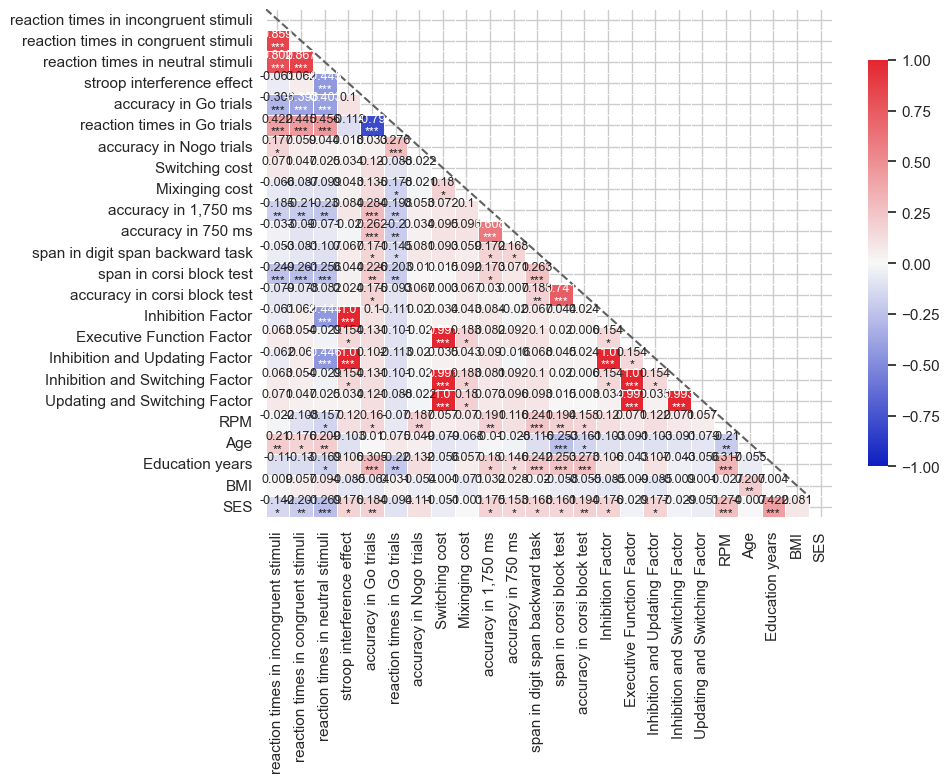

In [44]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与执行功能.jpg", dpi=100, bbox_inches='tight')
plt.show()

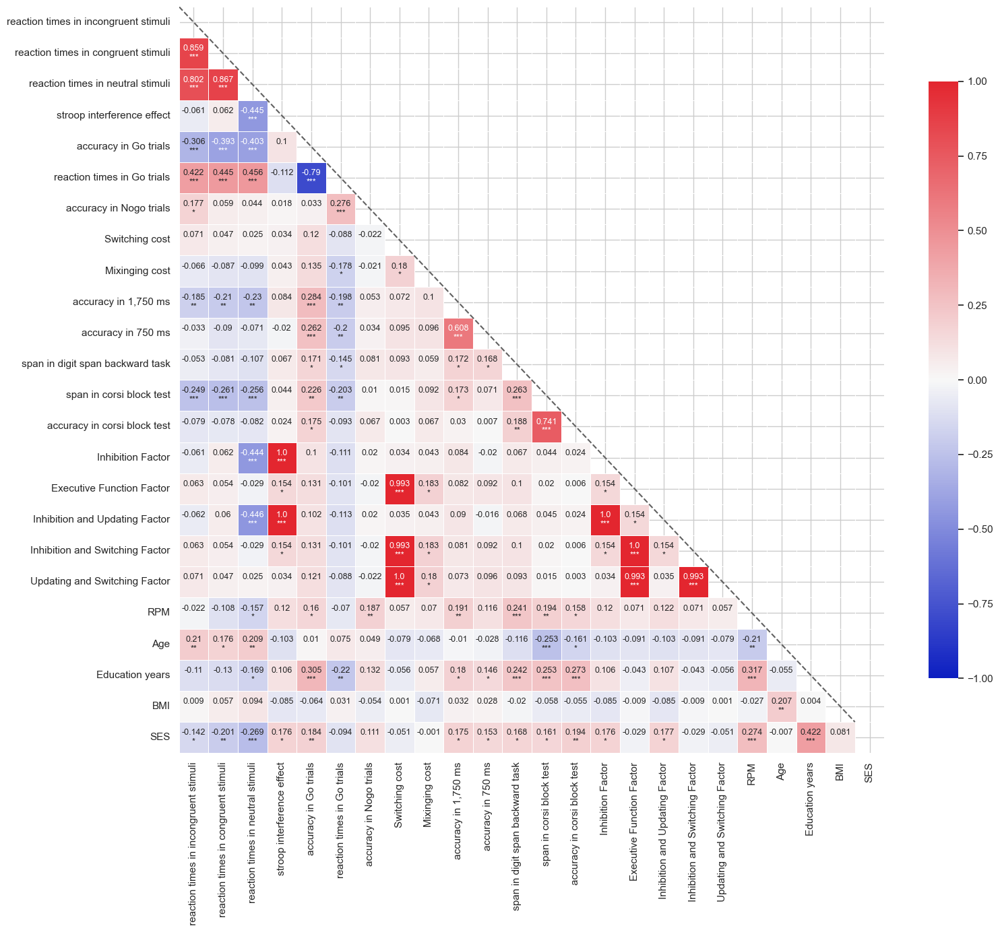

In [45]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(16, 14))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与执行功能.jpg", dpi=100, bbox_inches='tight')
plt.show()

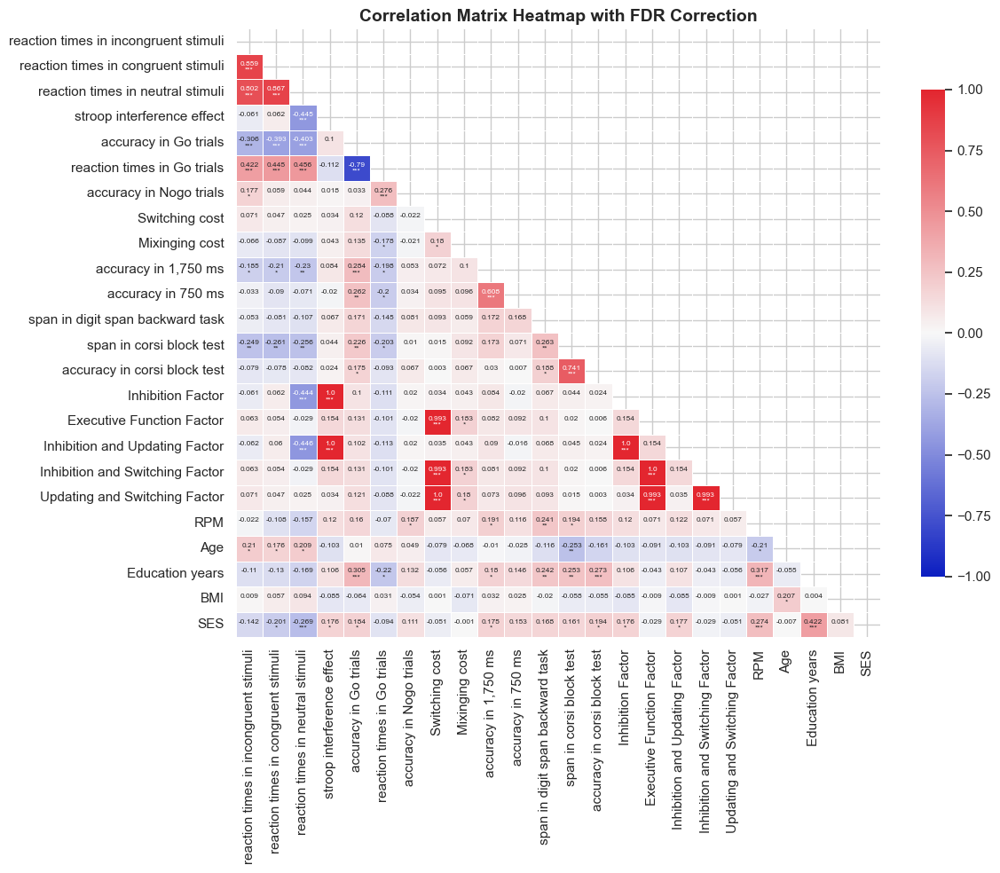

In [46]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与执行功能-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

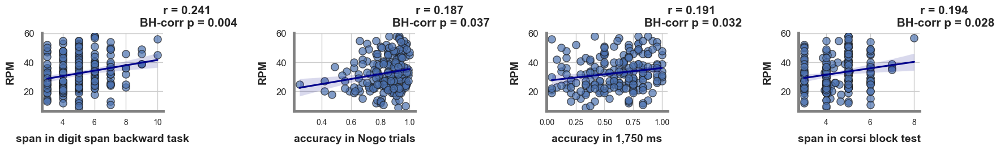

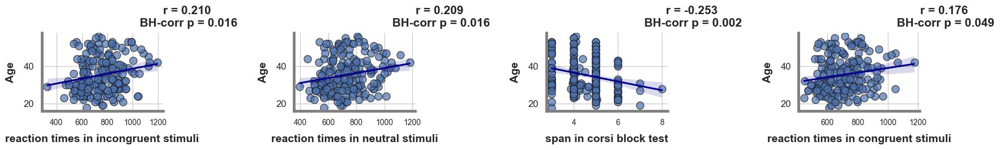

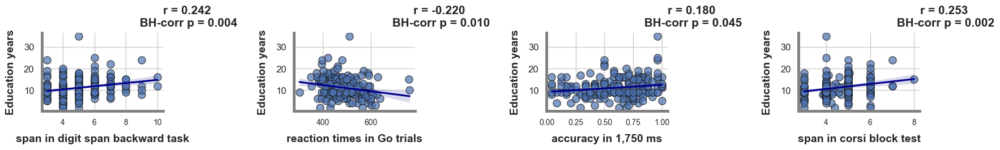

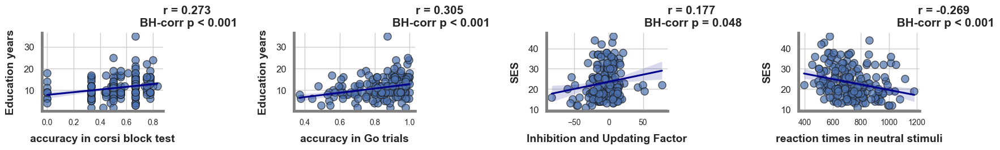

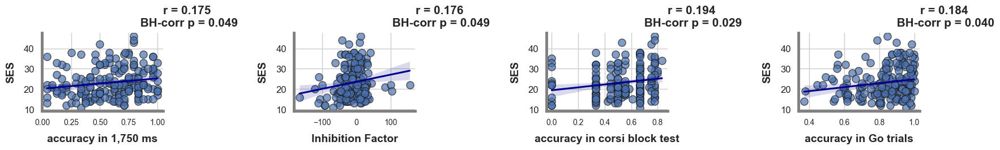

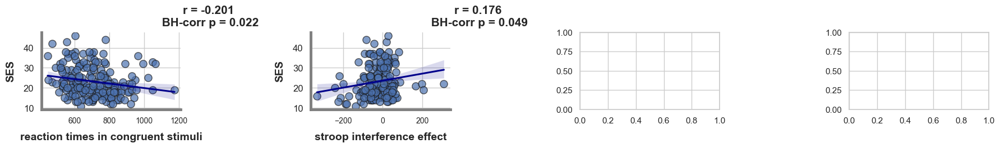

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr


variables_of_interest =  ['RPM', 'Age', 'Education years', 'BMI', 'SES']
significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

plots_per_figure = 4 

total_plots = sum([len(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist()) for var in variables_of_interest])

significant_plot_count = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pval_corr_matrix.loc[var1, var2]

        if corrected_p < 0.05:
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-患者-社会人口与执行功能-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(18, 3))
                plt_idx = 0 
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = data[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(1.2, 1.2, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            
            plt_idx += 1 
            significant_plot_count += 1  
if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/诊断-患者-社会人口与执行功能-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

### 4.整个放在一起FDR

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency
df = pd.read_excel('./results/after preprocessing-classification.xlsx')

data = df[df['Group'] == 1]

continuous_columns = ['reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'span in corsi block test', 'accuracy in corsi block test','Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor',
                      'RPM','Age', 'Education years', 'BMI', 'SES','PANSS Negative', 'PANSS Positive', 'PANSS Affective', 'PANSS Cognitive']



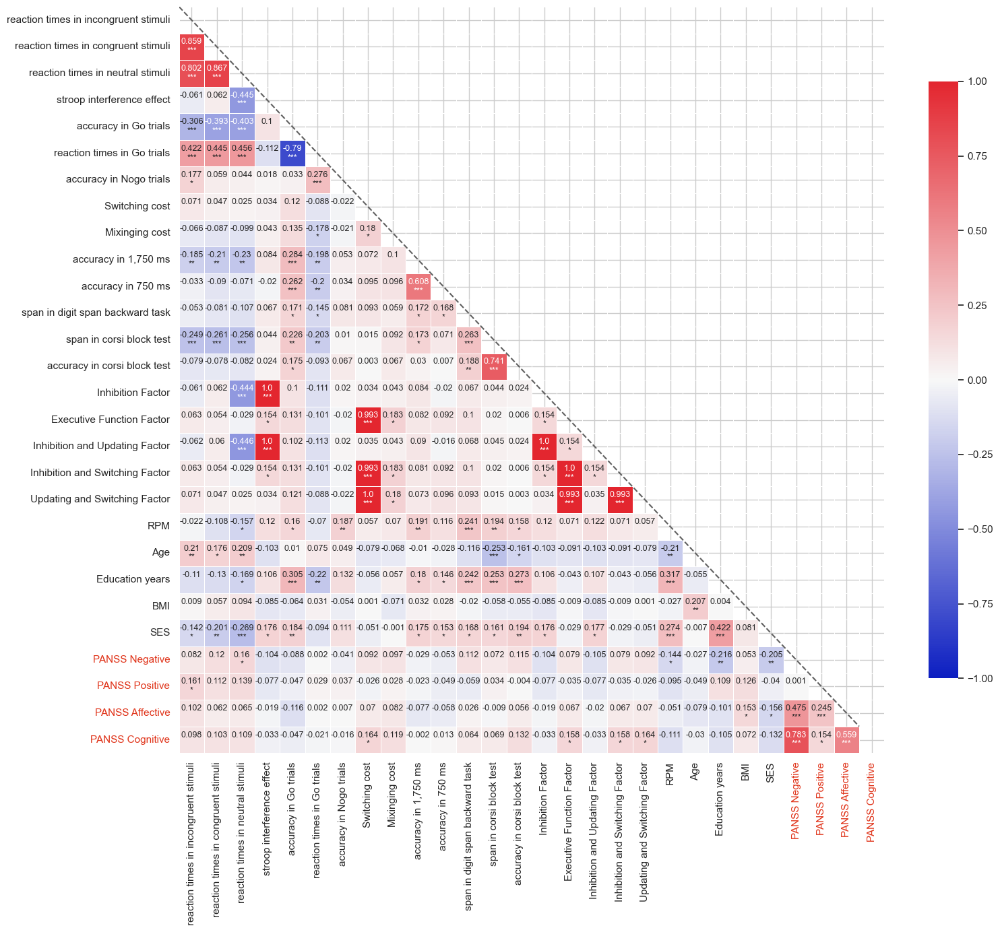

In [49]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(16,14))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-整个FDR.jpg", dpi=100, bbox_inches='tight')
plt.show()

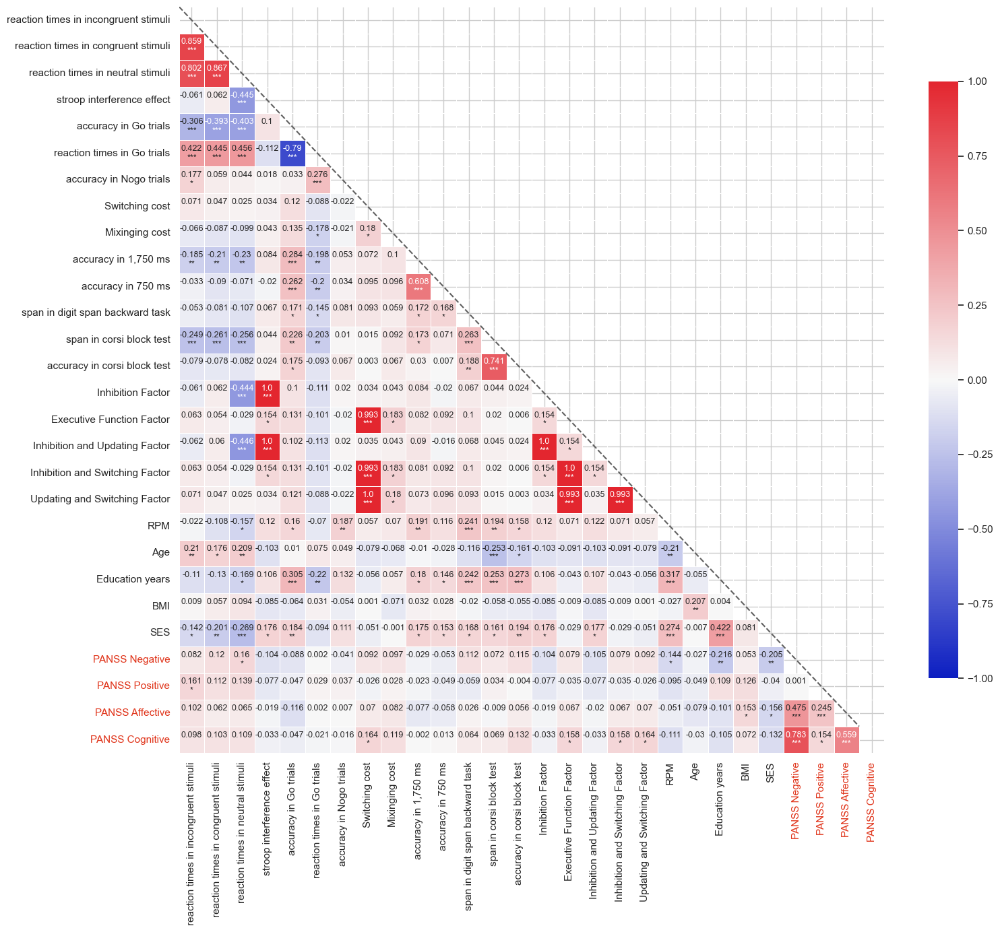

In [50]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(16, 14))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-整个FDR.jpg", dpi=100, bbox_inches='tight')
plt.show()

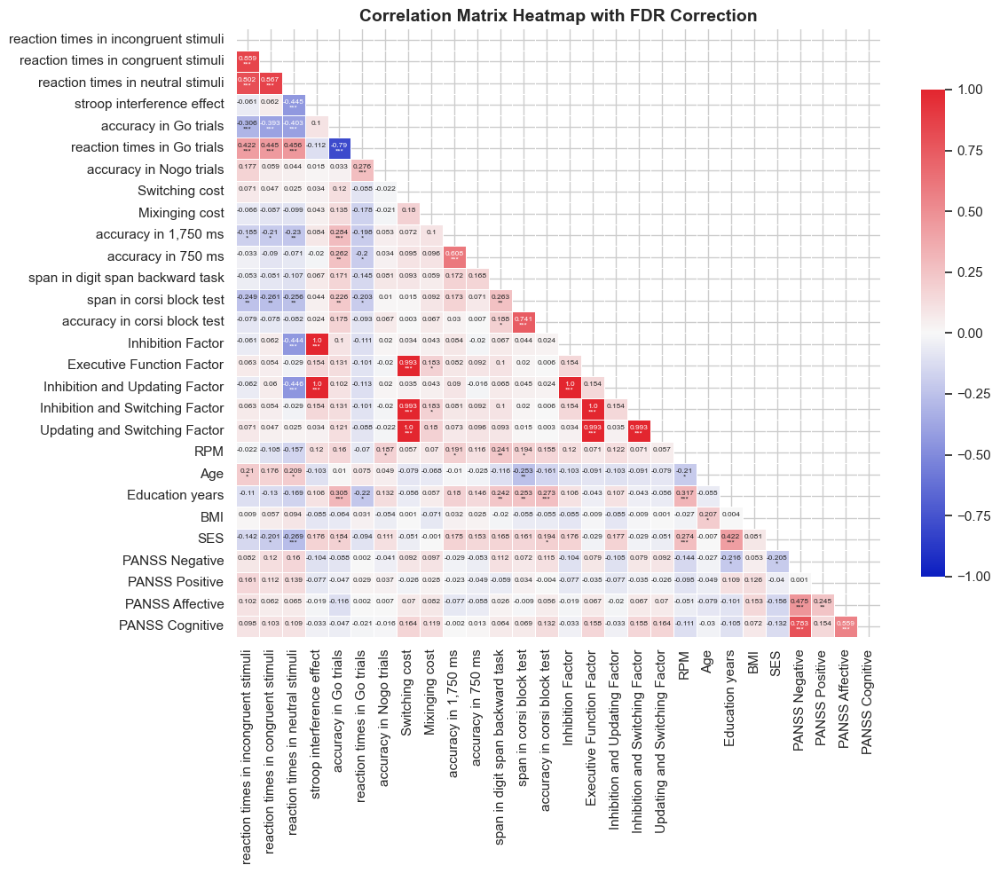

In [51]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/诊断-患者-整个FDR-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

#### 1.与社会人口

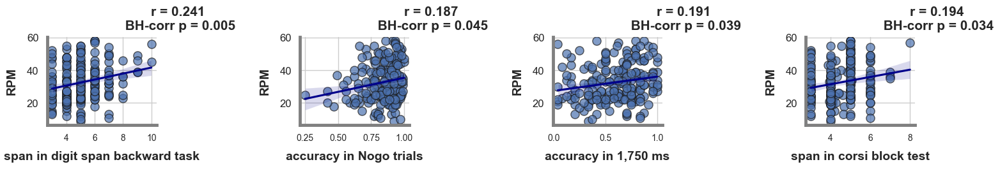

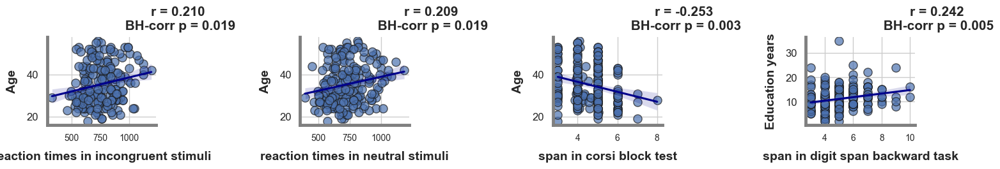

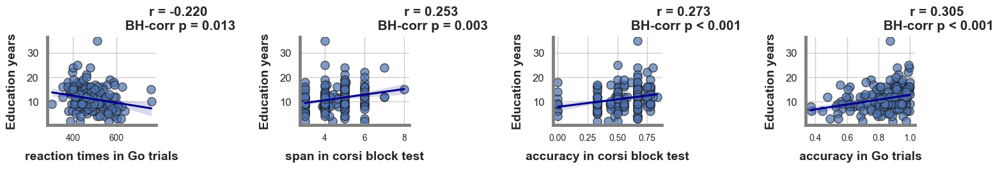

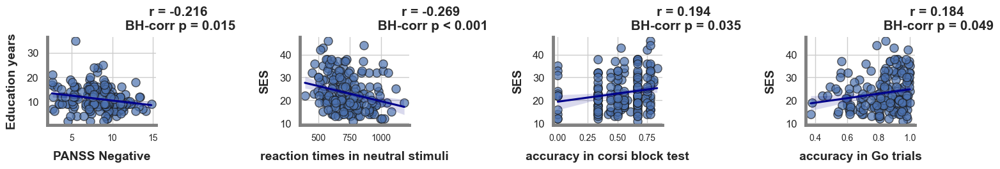

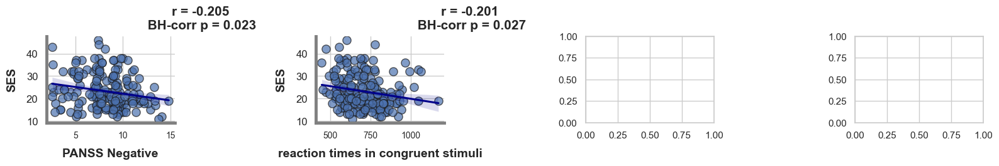

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest =  ['RPM', 'Age', 'Education years', 'BMI', 'SES']
significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

plots_per_figure = 4 

total_plots = sum([len(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist()) for var in variables_of_interest])

significant_plot_count = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pval_corr_matrix.loc[var1, var2]

        if corrected_p < 0.05:
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-患者-整个FDR-与社会人口-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(16, 3))
                plt_idx = 0  
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = data[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(1.2, 1.2, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            
            plt_idx += 1 
            significant_plot_count += 1

if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/诊断-患者-整个FDR-与社会人口-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

#### 2.与临床症状

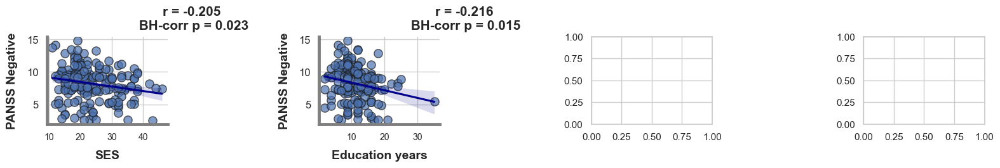

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest =  ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']
significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

plots_per_figure = 4 

total_plots = sum([len(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist()) for var in variables_of_interest])

significant_plot_count = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pval_corr_matrix.loc[var1, var2]

        if corrected_p < 0.05:
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-患者-整个FDR-与临床-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(16, 3))
                plt_idx = 0 
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = data[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(1.2, 1.2, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            
            plt_idx += 1 
            significant_plot_count += 1  

if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/诊断-患者-整个FDR-与临床-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

### 5.补充1：患者执行功能与临床量表相关分析（不fdr）

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

df = pd.read_excel('./results/after preprocessing-classification.xlsx')

data = df[df['Group'] == 1]

continuous_columns = ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive','reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'span in corsi block test', 'accuracy in corsi block test','Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor']

categorical_columns = ['Sex', 'Ethnic', 'Residence', 'Only child', 
                       'Smoking status', 'Alcohol consumption', 'Employed', 
                       'Marital status']

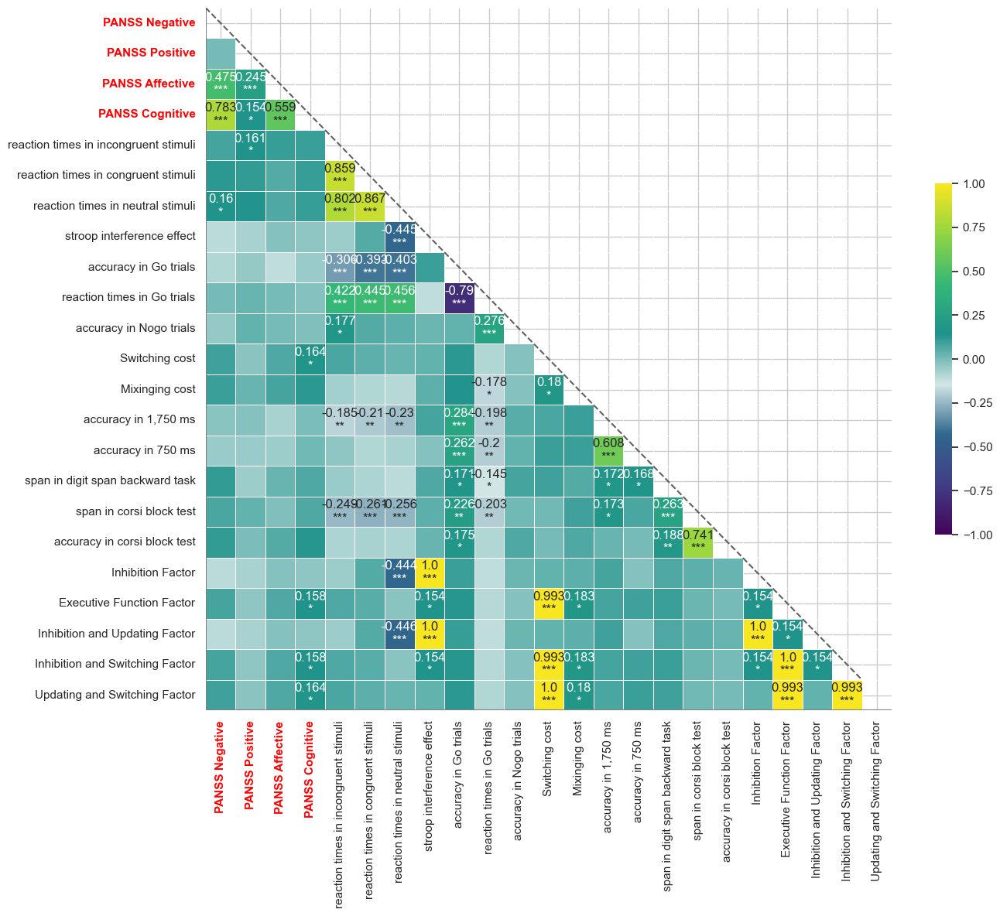

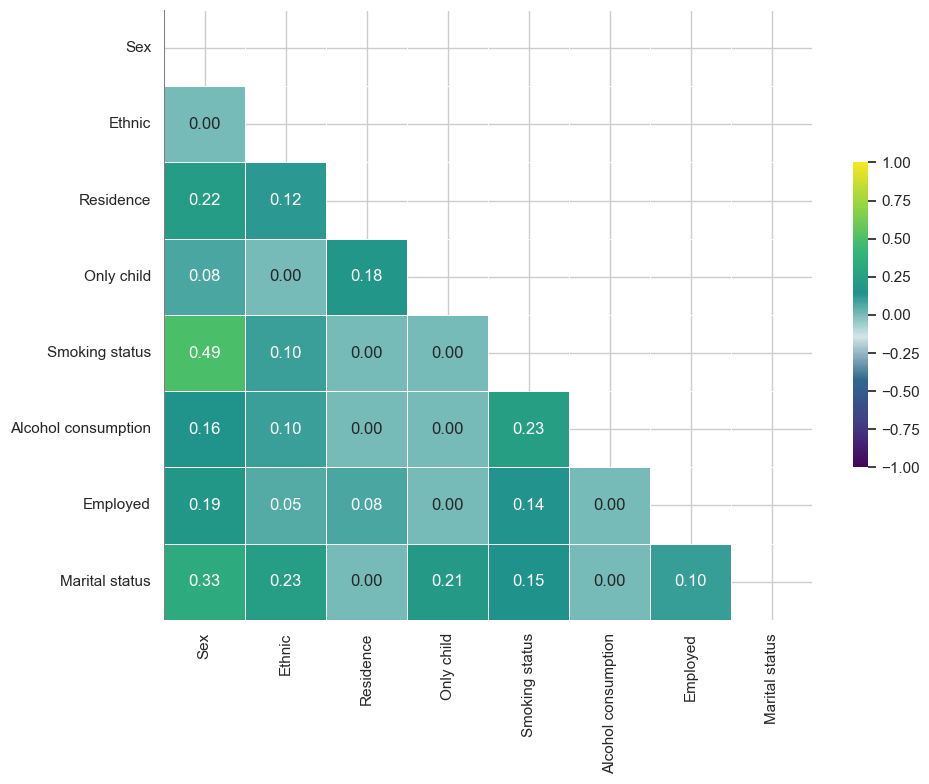

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr, chi2_contingency
import pandas as pd


rgb_colors = [
    (68, 4, 90),
    (65, 62, 133),
    (48, 104, 141),
    (210, 230, 230),  
    (31, 146, 139),
    (53, 183, 119),
    (145, 213, 66),
    (248, 230, 32)
]


hex_colors = ['#' + ''.join(['{:02x}'.format(val) for val in color]) for color in rgb_colors]


cmap = LinearSegmentedColormap.from_list("Custom", hex_colors, N=256)


corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels_corr = np.where((pvalues < 0.05), corr.round(3).astype(str), '')
labels_p = np.where((pvalues < 0.05), pvalues.applymap(significance_level), '')
labels = np.where((pvalues < 0.05), labels_corr + '\n' + labels_p, '')


mask = np.triu(np.ones_like(corr, dtype=bool))


np.fill_diagonal(corr.values, 0)
fig, ax = plt.subplots(figsize=(14, 12))


sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .5}, vmin=-1, vmax=1, annot_kws={"size": 12})

ax.axhline(y=len(corr), color='grey',linewidth=1.5)


ax.plot([0, 0], [0, len(corr)], color='grey', linewidth=1.5)

xticklabels = ax.get_xticklabels()
for label in xticklabels:
    text = label.get_text()
    if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
        label.set_color('red')
        label.set_weight('bold')
ax.set_xticklabels(xticklabels)


yticklabels = ax.get_yticklabels()
for label in yticklabels:
    text = label.get_text()
    if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
        label.set_color('red')
        label.set_weight('bold')
ax.set_yticklabels(yticklabels)


plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/患者执行功能与社会人口学信息、临床量表相关分析-连续变量.png", dpi=100, bbox_inches='tight')
plt.show()


def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))


corr_df = pd.DataFrame(index=categorical_columns, columns=categorical_columns)


for col1 in categorical_columns:
    for col2 in categorical_columns:
        corr_df.loc[col1, col2] = cramers_v(data[col1], data[col2])


corr_df = corr_df.apply(pd.to_numeric)


mask = np.triu(np.ones_like(corr_df, dtype=bool))


np.fill_diagonal(corr_df.values, 0)

fig, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(corr_df, mask=mask, cmap=cmap, center=0, annot=True, fmt='.2f', linewidths=.5, cbar_kws={"shrink": .5}, vmin=-1, vmax=1)
ax.axhline(y=len(corr), color='grey',linewidth=1.5)


ax.plot([0, 0], [0, len(corr)], color='grey', linewidth=1.5)
plt.tight_layout()
plt.savefig("./results/患者执行功能与社会人口学信息、临床量表相关分析-分类变量.jpg", dpi=100, bbox_inches='tight')
plt.show()

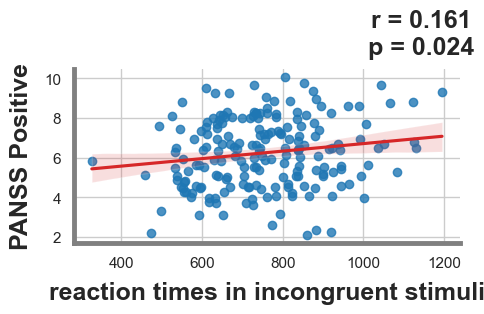

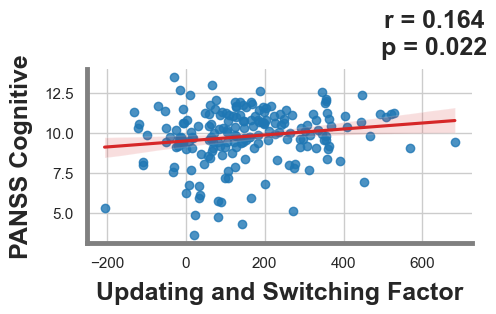

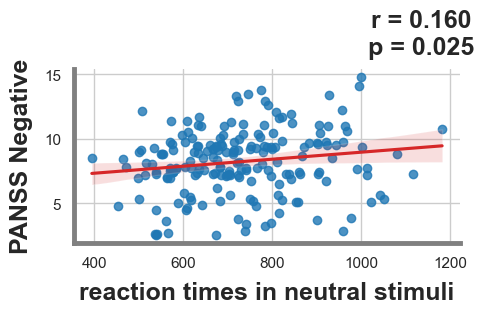

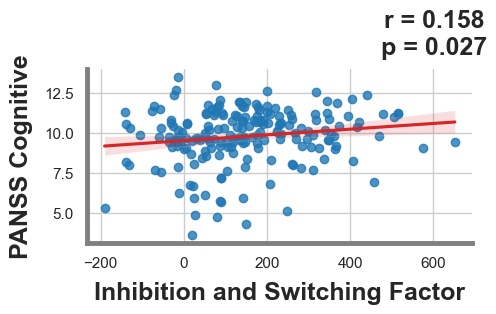

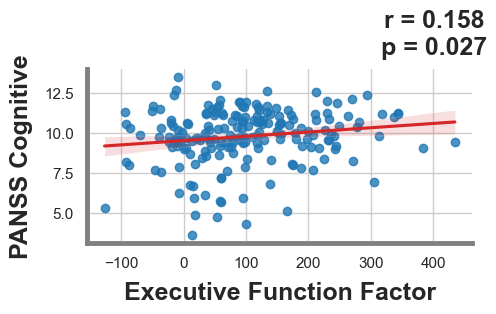

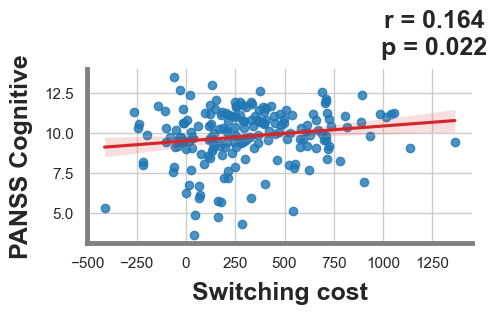

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

variables_of_interest = ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']

significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pvalues.loc[(pvalues[var] < 0.05) & (pvalues.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

blue_hex = "#1f77b4"
red_hex = "#d62728"
grey_hex = "#808080"

for var1 in significant_vars:
    for var2 in variables_of_interest:
        if pvalues.loc[var1, var2] < 0.05:
            plt.figure(figsize=(5, 3.5))

            sns.regplot(x=data[var1], y=data[var2], line_kws={'color': red_hex}, scatter_kws={'color': blue_hex}, ci=95)

            r, p = pearsonr(data[var1], data[var2])
            xpos = 0.9
            ypos = 1.2
            plt.text(xpos, ypos, f'r = {r:.3f}\np = {p:.3f}', fontsize=18, weight='bold', ha='center', va='center', transform=plt.gca().transAxes)

            plt.xlabel(var1, fontsize=18, weight='bold', labelpad=8)
            plt.ylabel(var2, fontsize=18, weight='bold', labelpad=8)


            ax = plt.gca()
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color(grey_hex)
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color(grey_hex)


            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

            plt.tight_layout()
            plt.savefig(f"./results/{var1}_vs-诊断患者EF-PANSS无FDR_{var2}.jpg", dpi=600, bbox_inches='tight')
            plt.show()

## 1.5对照组之间相关分析

In [59]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

df = pd.read_excel('./results/after preprocessing-classification.xlsx')

data = df[df['Group'] == 2]

continuous_columns = ['reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'span in corsi block test', 'accuracy in corsi block test','Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor',
                      'RPM','Age', 'Education years', 'BMI', 'SES']

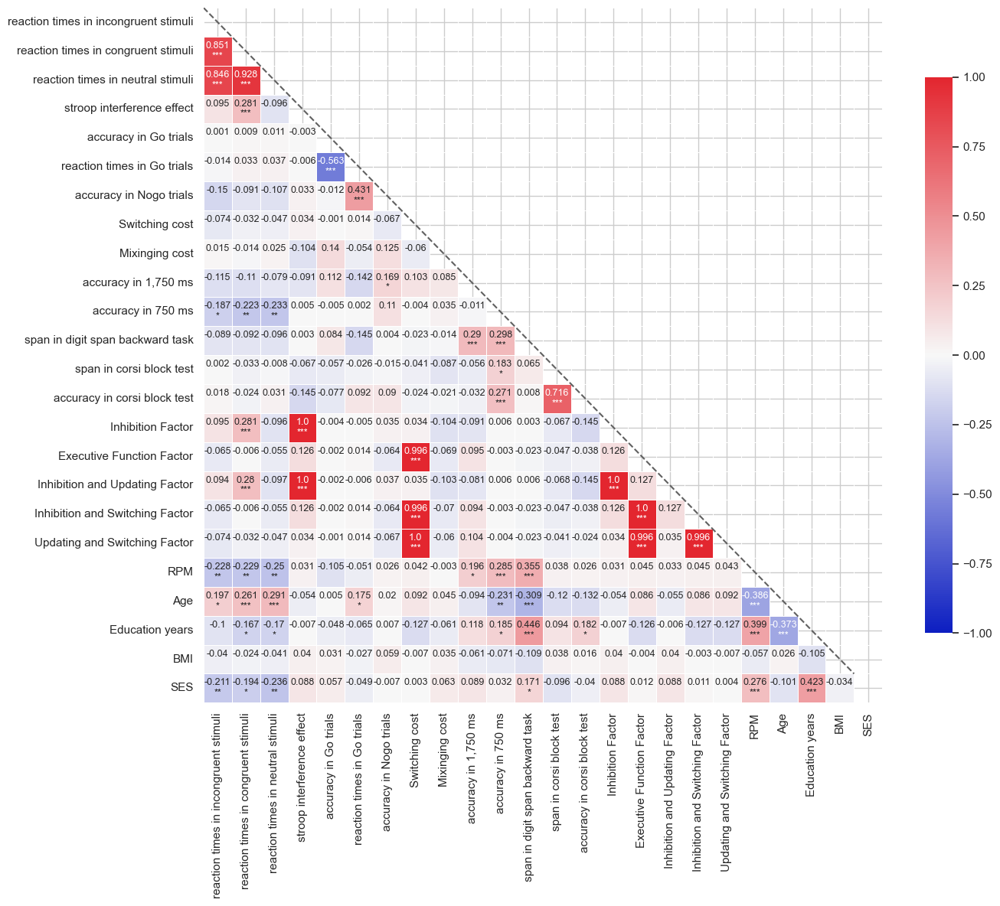

In [60]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 2]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-整个FDR-fdr-散点图-与临床.jpg", dpi=100, bbox_inches='tight')
plt.show()

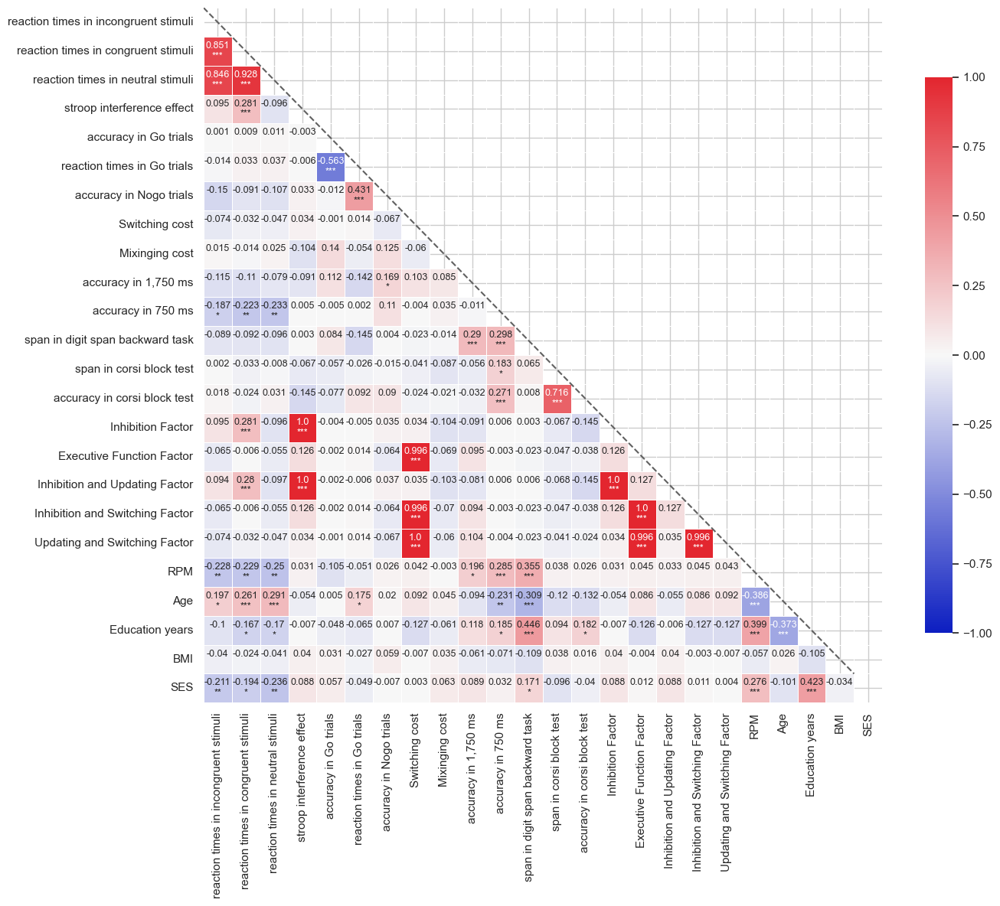

In [61]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 2]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS Affective',
                      'PANSS Cognitive']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-对照组-社会人口与执行功能.jpg", dpi=100, bbox_inches='tight')
plt.show()

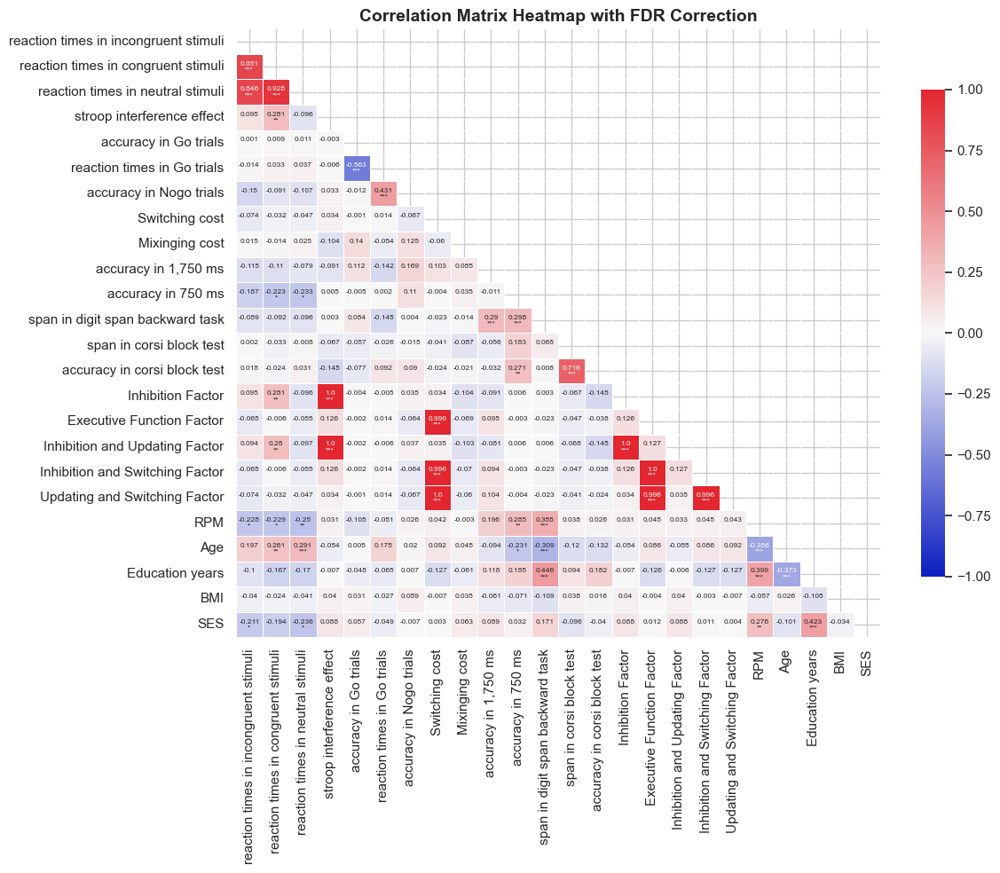

In [62]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/诊断-对照组-社会人口与执行功能-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

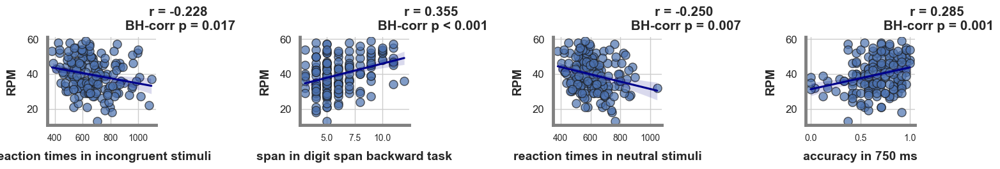

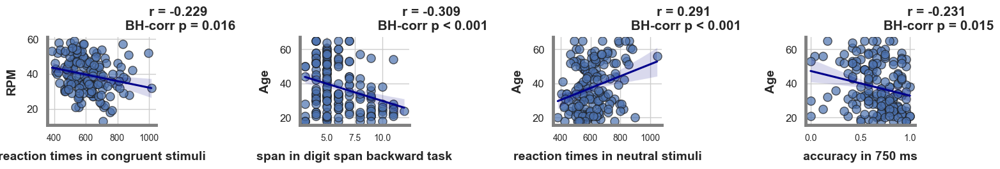

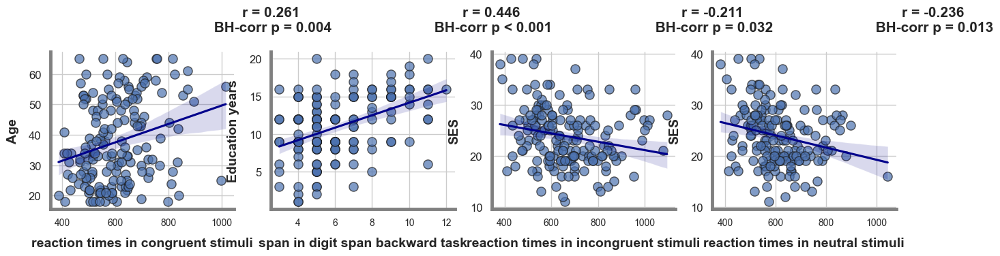

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest = ['RPM', 'Age', 'Education years', 'BMI', 'SES']
significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

plots_per_figure = 4 

total_plots = sum([len(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist()) for var in variables_of_interest])

significant_plot_count = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pval_corr_matrix.loc[var1, var2]

        if corrected_p < 0.05:
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-对照组-社会人口与执行功能-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(16, 3))
                plt_idx = 0
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = data[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(1.2, 1.2, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            
            plt_idx += 1  
            significant_plot_count += 1 

if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/诊断-对照组-社会人口与执行功能-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

# 2.分类预后

## 2.1数据预处理

In [64]:
import pandas as pd
data = pd.read_excel('./raw data/86.xlsx') 

In [65]:
data.isnull().sum()

ID                                         0
Group                                      0
Negative factor at baseline                0
Positive factor at baseline                0
Affective factor at baseline               0
                                          ..
Alcohol consumption                        0
Employed                                   0
Marital status                             0
Family history of psychiatric disorders    0
Previous medical history                   0
Length: 65, dtype: int64

In [66]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=1)
data_imputed = imp.fit_transform(data)

data_imputed = pd.DataFrame(data_imputed, columns=data.columns)

In [69]:
df = data_imputed 

In [70]:
df.isnull().sum()

ID                                         0
Group                                      0
Negative factor at baseline                0
Positive factor at baseline                0
Affective factor at baseline               0
                                          ..
Alcohol consumption                        0
Employed                                   0
Marital status                             0
Family history of psychiatric disorders    0
Previous medical history                   0
Length: 65, dtype: int64

In [71]:
df['Inhibition Factor at baseline'] = 0.5 * df['stroop interference effect at baseline'] + 0.5 * df['accuracy in Nogo trials at baseline']
df['Executive Function Factor at baseline'] = df['Inhibition Factor at baseline'] / 3 + df['accuracy in 1,750 ms at baseline'] / 3 + df['Switching cost at baseline'] / 3
df['Inhibition and Updating Factor at baseline'] = 0.5 * df['Inhibition Factor at baseline'] + 0.5 * df['accuracy in 1,750 ms at baseline']
df['Inhibition and Switching Factor at baseline'] = 0.5 * df['Inhibition Factor at baseline'] + 0.5 * df['Switching cost at baseline']
df['Updating and Switching Factor at baseline'] = 0.5 * df['accuracy in 1,750 ms at baseline'] + 0.5 * df['Switching cost at baseline']

In [72]:
df['Inhibition Factor at follow-up'] = 0.5 * df['stroop interference effect at follow-up'] + 0.5 * df['accuracy in Nogo trials at follow-up']
df['Executive Function Factor at follow-up'] = df['Inhibition Factor at follow-up'] / 3 + df['accuracy in 1,750 ms at baseline'] / 3 + df['Switching cost at follow-up'] / 3
df['Inhibition and Updating Factor at follow-up'] = 0.5 * df['Inhibition Factor at follow-up'] + 0.5 * df['accuracy in 1,750 ms at follow-up']
df['Inhibition and Switching Factor at follow-up'] = 0.5 * df['Inhibition Factor at follow-up'] + 0.5 * df['Switching cost at follow-up']
df['Updating and Switching Factor at follow-up'] = 0.5 * df['accuracy in 1,750 ms at follow-up'] + 0.5 * df['Switching cost at follow-up']

In [73]:
df.to_excel('./results/after preprocessing-prognosis.xlsx', sheet_name='Sheet1', index=True)

## 2.2差异检验

In [74]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib import rcParams


df = pd.read_excel('./results/after preprocessing-prognosis.xlsx')


### 1.追踪患者前后测差异检验

In [75]:
import numpy as np
from scipy import stats


def cohens_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (np.mean(x) - np.mean(y)) / np.sqrt(((nx-1)*np.std(x, ddof=1) ** 2 + (ny-1)*np.std(y, ddof=1) ** 2) / dof)

paired_cols = [
('reaction times in incongruent stimuli at baseline', 'reaction times in incongruent stimuli at follow-up'),
('reaction times in congruent stimuli at baseline', 'reaction times in congruent stimuli at follow-up'),
('reaction times in neutral stimuli at baseline', 'reaction times in neutral stimuli at follow-up'),
('stroop interference effect at baseline', 'stroop interference effect at follow-up'),
('accuracy in Go trials at baseline', 'accuracy in Go trials at follow-up'),
('reaction times in Go trials at baseline', 'reaction times in Go trials at follow-up'),
('accuracy in Nogo trials at baseline', 'accuracy in Nogo trials at follow-up'),
('Switching cost at baseline', 'Switching cost at follow-up'),
('Mixinging cost at baseline', 'Mixinging cost at follow-up'),
('accuracy in 1,750 ms at baseline', 'accuracy in 1,750 ms at follow-up'),
('accuracy in 750 ms at baseline', 'accuracy in 750 ms at follow-up'),
('span in digit span backward task at baseline', 'span in digit span backward task at follow-up'),
('span in corsi block test at baseline', 'span in corsi block test at follow-up'),
('accuracy in corsi block test at baseline', 'accuracy in corsi block test at follow-up'),
('Negative factor at baseline', 'Negative factor at follow-up'),
('Positive factor at baseline', 'Positive factor at follow-up'),
('Affective factor at baseline', 'Affective factor at follow-up'),
('Cognitive factor at baseline', 'Cognitive factor at follow-up')
]


for col1, col2 in paired_cols:
    pre_treatment = df[col1]
    post_treatment = df[col2]
    t_stat, p_val = stats.ttest_rel(pre_treatment, post_treatment)
    d = cohens_d(pre_treatment, post_treatment)
    if p_val < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_val:.3f}"
    print(f'变量 {col1} vs {col2}:\n治疗前平均值±标准差 = {pre_treatment.mean():.2f} ± {pre_treatment.std():.2f}\n治疗后平均值±标准差 = {post_treatment.mean():.2f} ± {post_treatment.std():.2f}\nt = {t_stat:.3f}, {p_val_str}, Cohen\'s d = {d:.3f}\n')

变量 reaction times in incongruent stimuli at baseline vs reaction times in incongruent stimuli at follow-up:
治疗前平均值±标准差 = 764.28 ± 152.17
治疗后平均值±标准差 = 721.14 ± 140.05
t = 2.763, p = 0.007, Cohen's d = 0.295

变量 reaction times in congruent stimuli at baseline vs reaction times in congruent stimuli at follow-up:
治疗前平均值±标准差 = 723.00 ± 133.13
治疗后平均值±标准差 = 677.56 ± 121.80
t = 3.264, p = 0.002, Cohen's d = 0.356

变量 reaction times in neutral stimuli at baseline vs reaction times in neutral stimuli at follow-up:
治疗前平均值±标准差 = 719.80 ± 185.46
治疗后平均值±标准差 = 686.10 ± 124.85
t = 1.673, p = 0.098, Cohen's d = 0.213

变量 stroop interference effect at baseline vs stroop interference effect at follow-up:
治疗前平均值±标准差 = 3.20 ± 145.73
治疗后平均值±标准差 = -8.53 ± 63.52
t = 0.702, p = 0.484, Cohen's d = 0.104

变量 accuracy in Go trials at baseline vs accuracy in Go trials at follow-up:
治疗前平均值±标准差 = 0.82 ± 0.15
治疗后平均值±标准差 = 0.82 ± 0.15
t = 0.041, p = 0.968, Cohen's d = 0.005

变量 reaction times in Go trials at baseline 

In [76]:
import numpy as np
from scipy import stats
from statsmodels.stats.multitest import multipletests

def cohens_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (np.mean(x) - np.mean(y)) / np.sqrt(((nx-1)*np.std(x, ddof=1) ** 2 + (ny-1)*np.std(y, ddof=1) ** 2) / dof)

paired_cols = [
('reaction times in incongruent stimuli at baseline', 'reaction times in incongruent stimuli at follow-up'),
('reaction times in congruent stimuli at baseline', 'reaction times in congruent stimuli at follow-up'),
('reaction times in neutral stimuli at baseline', 'reaction times in neutral stimuli at follow-up'),
('stroop interference effect at baseline', 'stroop interference effect at follow-up'),
('accuracy in Go trials at baseline', 'accuracy in Go trials at follow-up'),
('reaction times in Go trials at baseline', 'reaction times in Go trials at follow-up'),
('accuracy in Nogo trials at baseline', 'accuracy in Nogo trials at follow-up'),
('Switching cost at baseline', 'Switching cost at follow-up'),
('Mixinging cost at baseline', 'Mixinging cost at follow-up'),
('accuracy in 1,750 ms at baseline', 'accuracy in 1,750 ms at follow-up'),
('accuracy in 750 ms at baseline', 'accuracy in 750 ms at follow-up'),
('span in digit span backward task at baseline', 'span in digit span backward task at follow-up'),
('span in corsi block test at baseline', 'span in corsi block test at follow-up'),
('accuracy in corsi block test at baseline', 'accuracy in corsi block test at follow-up')
]

p_values = []
for col1, col2 in paired_cols:
    pre_treatment = df[col1]
    post_treatment = df[col2]
    t_stat, p_val = stats.ttest_rel(pre_treatment, post_treatment)
    p_values.append(p_val)

rejected, corrected_p_values, _, _ = multipletests(p_values, method='fdr_bh')

for i, (col1, col2) in enumerate(paired_cols):
    pre_treatment = df[col1]
    post_treatment = df[col2]
    t_stat, p_val = stats.ttest_rel(pre_treatment, post_treatment)
    d = cohens_d(pre_treatment, post_treatment)
    corrected_p_val = corrected_p_values[i]
    if corrected_p_val < 0.001:
        p_val_str = "corrected p < 0.001"
    else:
        p_val_str = f"corrected p = {corrected_p_val:.3f}"
    print(f'变量 {col1} vs {col2}:\n治疗前平均值±标准差 = {pre_treatment.mean():.2f} ± {pre_treatment.std():.2f}\n治疗后平均值±标准差 = {post_treatment.mean():.2f} ± {post_treatment.std():.2f}\nt = {t_stat:.3f}, {p_val_str}, Cohen\'s d = {d:.3f}\n')

变量 reaction times in incongruent stimuli at baseline vs reaction times in incongruent stimuli at follow-up:
治疗前平均值±标准差 = 764.28 ± 152.17
治疗后平均值±标准差 = 721.14 ± 140.05
t = 2.763, corrected p = 0.049, Cohen's d = 0.295

变量 reaction times in congruent stimuli at baseline vs reaction times in congruent stimuli at follow-up:
治疗前平均值±标准差 = 723.00 ± 133.13
治疗后平均值±标准差 = 677.56 ± 121.80
t = 3.264, corrected p = 0.022, Cohen's d = 0.356

变量 reaction times in neutral stimuli at baseline vs reaction times in neutral stimuli at follow-up:
治疗前平均值±标准差 = 719.80 ± 185.46
治疗后平均值±标准差 = 686.10 ± 124.85
t = 1.673, corrected p = 0.258, Cohen's d = 0.213

变量 stroop interference effect at baseline vs stroop interference effect at follow-up:
治疗前平均值±标准差 = 3.20 ± 145.73
治疗后平均值±标准差 = -8.53 ± 63.52
t = 0.702, corrected p = 0.616, Cohen's d = 0.104

变量 accuracy in Go trials at baseline vs accuracy in Go trials at follow-up:
治疗前平均值±标准差 = 0.82 ± 0.15
治疗后平均值±标准差 = 0.82 ± 0.15
t = 0.041, corrected p = 0.968, Cohen's d = 

### 仅缓解组

In [77]:
df = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

In [78]:
import numpy as np
from scipy import stats
df = df[df['Group'] == 1]

In [79]:

def cohens_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (np.mean(x) - np.mean(y)) / np.sqrt(((nx-1)*np.std(x, ddof=1) ** 2 + (ny-1)*np.std(y, ddof=1) ** 2) / dof)


paired_cols = [
('reaction times in incongruent stimuli at baseline', 'reaction times in incongruent stimuli at follow-up'),
('reaction times in congruent stimuli at baseline', 'reaction times in congruent stimuli at follow-up'),
('reaction times in neutral stimuli at baseline', 'reaction times in neutral stimuli at follow-up'),
('stroop interference effect at baseline', 'stroop interference effect at follow-up'),
('accuracy in Go trials at baseline', 'accuracy in Go trials at follow-up'),
('reaction times in Go trials at baseline', 'reaction times in Go trials at follow-up'),
('accuracy in Nogo trials at baseline', 'accuracy in Nogo trials at follow-up'),
('Switching cost at baseline', 'Switching cost at follow-up'),
('Mixinging cost at baseline', 'Mixinging cost at follow-up'),
('accuracy in 1,750 ms at baseline', 'accuracy in 1,750 ms at follow-up'),
('accuracy in 750 ms at baseline', 'accuracy in 750 ms at follow-up'),
('span in digit span backward task at baseline', 'span in digit span backward task at follow-up'),
('span in corsi block test at baseline', 'span in corsi block test at follow-up'),
('accuracy in corsi block test at baseline', 'accuracy in corsi block test at follow-up'),
('Inhibition Factor at baseline', 'Inhibition Factor at follow-up'),
('Executive Function Factor at baseline', 'Executive Function Factor at follow-up'),
('Inhibition and Updating Factor at baseline', 'Inhibition and Updating Factor at follow-up'),
('Inhibition and Switching Factor at baseline', 'Inhibition and Switching Factor at follow-up'),
('Updating and Switching Factor at baseline', 'Updating and Switching Factor at follow-up')
]


for col1, col2 in paired_cols:
    pre_treatment = df[col1]
    post_treatment = df[col2]
    t_stat, p_val = stats.ttest_rel(pre_treatment, post_treatment)
    d = cohens_d(pre_treatment, post_treatment)
    if p_val < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_val:.3f}"
    print(f'变量 {col1} vs {col2}:\n治疗前平均值±标准差 = {pre_treatment.mean():.2f} ± {pre_treatment.std():.2f}\n治疗后平均值±标准差 = {post_treatment.mean():.2f} ± {post_treatment.std():.2f}\nt = {t_stat:.3f}, {p_val_str}, Cohen\'s d = {d:.3f}\n')

变量 reaction times in incongruent stimuli at baseline vs reaction times in incongruent stimuli at follow-up:
治疗前平均值±标准差 = 761.09 ± 126.35
治疗后平均值±标准差 = 709.18 ± 135.32
t = 3.019, p = 0.004, Cohen's d = 0.397

变量 reaction times in congruent stimuli at baseline vs reaction times in congruent stimuli at follow-up:
治疗前平均值±标准差 = 728.39 ± 128.19
治疗后平均值±标准差 = 672.81 ± 116.20
t = 3.102, p = 0.003, Cohen's d = 0.454

变量 reaction times in neutral stimuli at baseline vs reaction times in neutral stimuli at follow-up:
治疗前平均值±标准差 = 729.81 ± 166.78
治疗后平均值±标准差 = 684.44 ± 124.63
t = 2.107, p = 0.040, Cohen's d = 0.308

变量 stroop interference effect at baseline vs stroop interference effect at follow-up:
治疗前平均值±标准差 = -1.41 ± 137.25
治疗后平均值±标准差 = -11.62 ± 71.45
t = 0.505, p = 0.615, Cohen's d = 0.093

变量 accuracy in Go trials at baseline vs accuracy in Go trials at follow-up:
治疗前平均值±标准差 = 0.82 ± 0.14
治疗后平均值±标准差 = 0.81 ± 0.15
t = 0.523, p = 0.603, Cohen's d = 0.063

变量 reaction times in Go trials at baselin

### 2.缓解组与未缓解组组间差异检验

In [80]:
data = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

In [81]:
numeric_cols = [
'reaction times in incongruent stimuli at baseline',
'reaction times in congruent stimuli at baseline',
'reaction times in neutral stimuli at baseline',
'stroop interference effect at baseline',
'accuracy in Go trials at baseline',
'reaction times in Go trials at baseline',
'accuracy in Nogo trials at baseline',
'Switching cost at baseline',
'Mixinging cost at baseline',
'accuracy in 1,750 ms at baseline',
'accuracy in 750 ms at baseline',
'span in digit span backward task at baseline',
'span in corsi block test at baseline',
'accuracy in corsi block test at baseline',
'Inhibition Factor at baseline',
'Executive Function Factor at baseline',
'Inhibition and Updating Factor at baseline',
'Inhibition and Switching Factor at baseline',
'Updating and Switching Factor at baseline',
'reaction times in incongruent stimuli at follow-up',
'reaction times in congruent stimuli at follow-up',
'reaction times in neutral stimuli at follow-up',
'stroop interference effect at follow-up',
'accuracy in Go trials at follow-up',
'reaction times in Go trials at follow-up',
'accuracy in Nogo trials at follow-up',
'Switching cost at follow-up',
'Mixinging cost at follow-up',
'accuracy in 1,750 ms at follow-up',
'accuracy in 750 ms at follow-up',
'span in digit span backward task at follow-up',
'span in corsi block test at follow-up',
'accuracy in corsi block test at follow-up',
'Inhibition Factor at follow-up',
'Executive Function Factor at follow-up',
'Inhibition and Updating Factor at follow-up',
'Inhibition and Switching Factor at follow-up',
'Updating and Switching Factor at follow-up',
'RPM',
'Age',
'Education years',
'BMI',
'SES',
'PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS generalat baseline',
'PANNS total scores at baseline',
'Negative factor at baseline',
'Positive factor at baseline',
'Affective factor at baseline',
'Cognitive factor at baseline',
'Frequency of episodes',
'Age of onset',
'Illness of duration (years)',
'Negative factor at follow-up',
'Positive factor at follow-up',
'Affective factor at follow-up',
'Cognitive factor at follow-up'
]
categorical_cols = [
    'First episode',
    'Gender',
    'Ethnic',
    'Residence',
    'Only child',
    'Smoking status',
    'Alcohol consumption',
    'Employed',
    'Marital status',
    'Family history of psychiatric disorders',
    'Previous medical history'
]
df = data
print(df.columns)

Index(['Unnamed: 0', 'ID', 'Group', 'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline', 'Negative factor at follow-up',
       'Positive factor at follow-up', 'Affective factor at follow-up',
       'Cognitive factor at follow-up', 'Change in negative factor',
       'Change in positive factor', 'Change in affective  factor',
       'Change in cognitive  factor',
       'reaction times in incongruent stimuli at baseline',
       'reaction times in congruent stimuli at baseline',
       'reaction times in neutral stimuli at baseline',
       'stroop interference effect at baseline',
       'accuracy in Go trials at baseline',
       'reaction times in Go trials at baseline',
       'accuracy in Nogo trials at baseline', 'Switching cost at baseline',
       'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline',
       'accuracy in 750 ms at baseline',
       'span in digit span backward tas

In [82]:
import pandas as pd
from scipy.stats import ttest_ind
from numpy import std, mean, sqrt




def cohens_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (mean(x) - mean(y)) / sqrt(((nx-1)*std(x, ddof=1) ** 2 + (ny-1)*std(y, ddof=1) ** 2) / dof)

results_df = pd.DataFrame(columns=['Variable', 'Remission_Mean', 'Remission_SD', 'NoRemission_Mean', 'NoRemission_SD', 't_stat', 'p_value', 'Cohen_d'])

for col in numeric_cols:
    remission = df[df['Group'] == 1][col]
    no_remission = df[df['Group'] == 2][col]
    t_stat, p_val = ttest_ind(remission, no_remission)
    d = cohens_d(remission, no_remission)
    if p_val < 0.001:
        p_val_str = "< 0.001"
    else:
        p_val_str = f"{p_val:.3f}"
        

        results_df = pd.concat([results_df, pd.DataFrame({
            'Variable': [col],
            'Remission_Mean': [remission.mean()],
            'Remission_SD': [remission.std()],
            'NoRemission_Mean': [no_remission.mean()],
            'NoRemission_SD': [no_remission.std()],
            't_stat': [t_stat],
            'p_value': [p_val_str],
            'Cohen_d': [d]
        })], ignore_index=True)

results_df.to_excel('./results/t_test_results-86.xlsx', index=False)

In [83]:
import pandas as pd
from scipy.stats import chi2_contingency
import numpy as np


results = []


results_df = pd.DataFrame(columns=['Variable', 'remission Counts', 'remission Percentages', 'no-remission Counts', 'no-remission Percentages', 'Chi2', 'p', 'Cramer\'s V'])

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))



for col in categorical_cols:
    contingency_table = pd.crosstab(df['Group'], df[col])
    
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    n1 = df[df['Group'] == 1][col].value_counts().sort_index().values
    n2 = df[df['Group'] == 2][col].value_counts().sort_index().values
    
    remission_counts = ', '.join(map(str, n1))
    remission_percentages = ', '.join(f'{perc*100:.1f}%' for perc in n1/n1.sum())
    noremission_counts = ', '.join(map(str, n2))
    noremission_percentages = ', '.join(f'{perc*100:.1f}%' for perc in n2/n2.sum())
    
    cramers_v_value = cramers_v(df['Group'], df[col])
    
    if p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p:.3f}"
        

    result = pd.DataFrame({
        'Variable': [col],
        'remission Counts': [remission_counts],
        'remission Percentages': [remission_percentages],
        'no-remission Counts': [noremission_counts],
        'no-remission Percentages': [noremission_percentages],
        'Chi2': [chi2],
        'p': [p_val_str],
        'Cramer\'s V': [cramers_v_value]
    })


    results.append(result)


results_df = pd.concat(results, ignore_index=True)


results_df.to_excel('./results/chi_square_test_results-86.xlsx', index=False)

### 3.治疗前后EFs的变化是否存在显著性差异

In [84]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
data = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

def clean_variable_name(name):
    return name.replace(' ', '_').replace(',', '').replace('.', '_')

def reshape_data(df, measure):
    baseline_col = measure + " at baseline"
    followup_col = measure + " at follow-up"
    new_measure = clean_variable_name(measure)
    df_long = df.melt(id_vars="Group", value_vars=[baseline_col, followup_col], 
                      var_name="Time", value_name=new_measure)
    df_long["Time"] = df_long["Time"].str.contains("follow-up").map({True: "post_treatment", False: "baseline"})
    return df_long


measures = ['reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 
            'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 
            'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'span in corsi block test', 'accuracy in corsi block test']


all_anova_results = pd.DataFrame()

for measure in measures:
    df_long = reshape_data(data, measure)
    new_measure = clean_variable_name(measure)
    model = ols(f'{new_measure} ~ C(Time) + C(Group) + C(Time):C(Group)', data=df_long).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    

    anova_table_single_col = anova_table.stack().to_frame().T
    anova_table_single_col.index = [measure]
    all_anova_results = pd.concat([all_anova_results, anova_table_single_col])


all_anova_results.to_excel("./results/anova_results.xlsx")

## 2.3相关分析

### 1.分开FDR

#### 1.执行功能与PANSS四维

In [85]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

df = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

continuous_columns = ['reaction times in incongruent stimuli at baseline', 'reaction times in congruent stimuli at baseline', 'reaction times in neutral stimuli at baseline', 'stroop interference effect at baseline', 'accuracy in Go trials at baseline', 'reaction times in Go trials at baseline', 'accuracy in Nogo trials at baseline', 'Switching cost at baseline', 'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline', 'accuracy in 750 ms at baseline', 'span in digit span backward task at baseline', 'span in corsi block test at baseline', 'accuracy in corsi block test at baseline',                
      'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline','Change in negative factor',
       'Change in positive factor', 'Change in affective  factor',
       'Change in cognitive  factor', 'Negative factor at follow-up',
       'Positive factor at follow-up', 'Affective factor at follow-up',
       'Cognitive factor at follow-up']
                      
                  

In [86]:
print(df.columns)

Index(['Unnamed: 0', 'ID', 'Group', 'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline', 'Negative factor at follow-up',
       'Positive factor at follow-up', 'Affective factor at follow-up',
       'Cognitive factor at follow-up', 'Change in negative factor',
       'Change in positive factor', 'Change in affective  factor',
       'Change in cognitive  factor',
       'reaction times in incongruent stimuli at baseline',
       'reaction times in congruent stimuli at baseline',
       'reaction times in neutral stimuli at baseline',
       'stroop interference effect at baseline',
       'accuracy in Go trials at baseline',
       'reaction times in Go trials at baseline',
       'accuracy in Nogo trials at baseline', 'Switching cost at baseline',
       'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline',
       'accuracy in 750 ms at baseline',
       'span in digit span backward tas

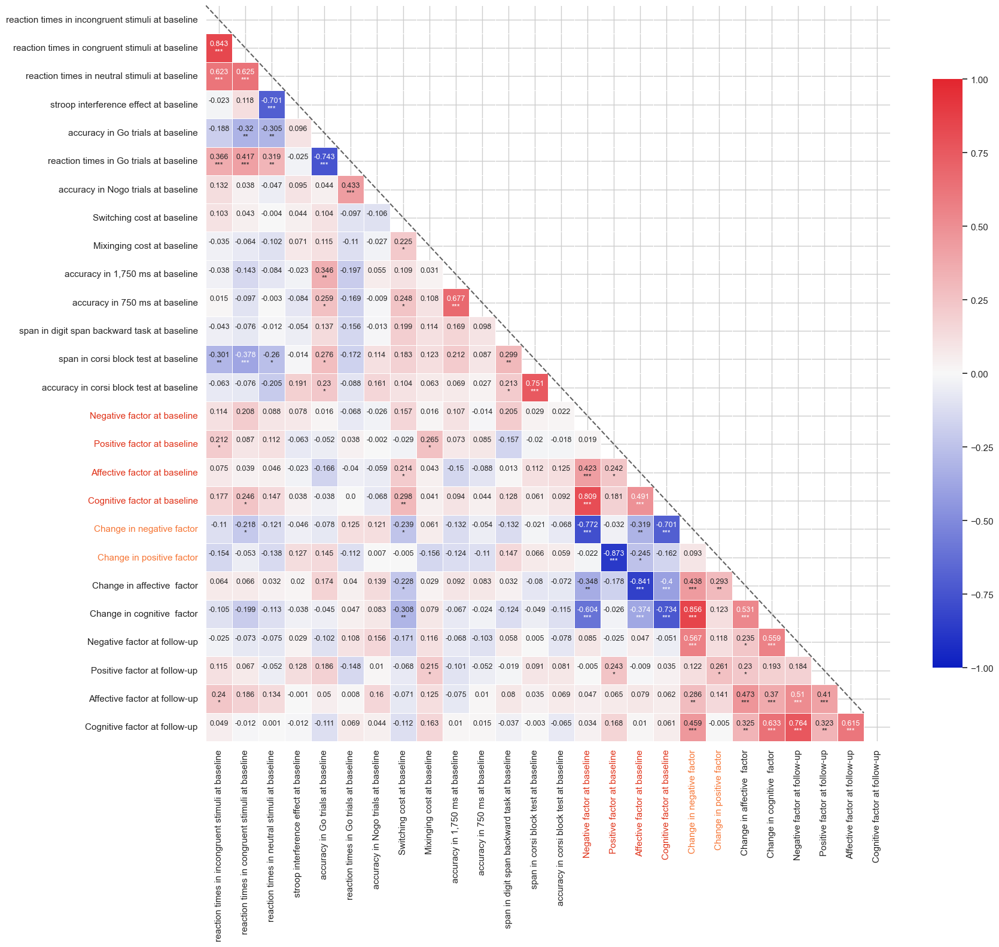

In [87]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(18, 16))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()

def color_labels(labels):
    for label in labels:
        text = label.get_text()

        if text in [ 'Negative factor at baseline', 'Positive factor at baseline', 'Affective factor at baseline', 'Cognitive factor at baseline',]:
            label.set_color('#E0341A') 
        elif text in ['Change in negative factor', 'Change in positive factor', 'Change in affective factor', 'Change in cognitive factor']:
            label.set_color('#F67737')  

color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/预后-分开fdr-执行功能与PANSS四维.jpg", dpi=100, bbox_inches='tight')
plt.show()

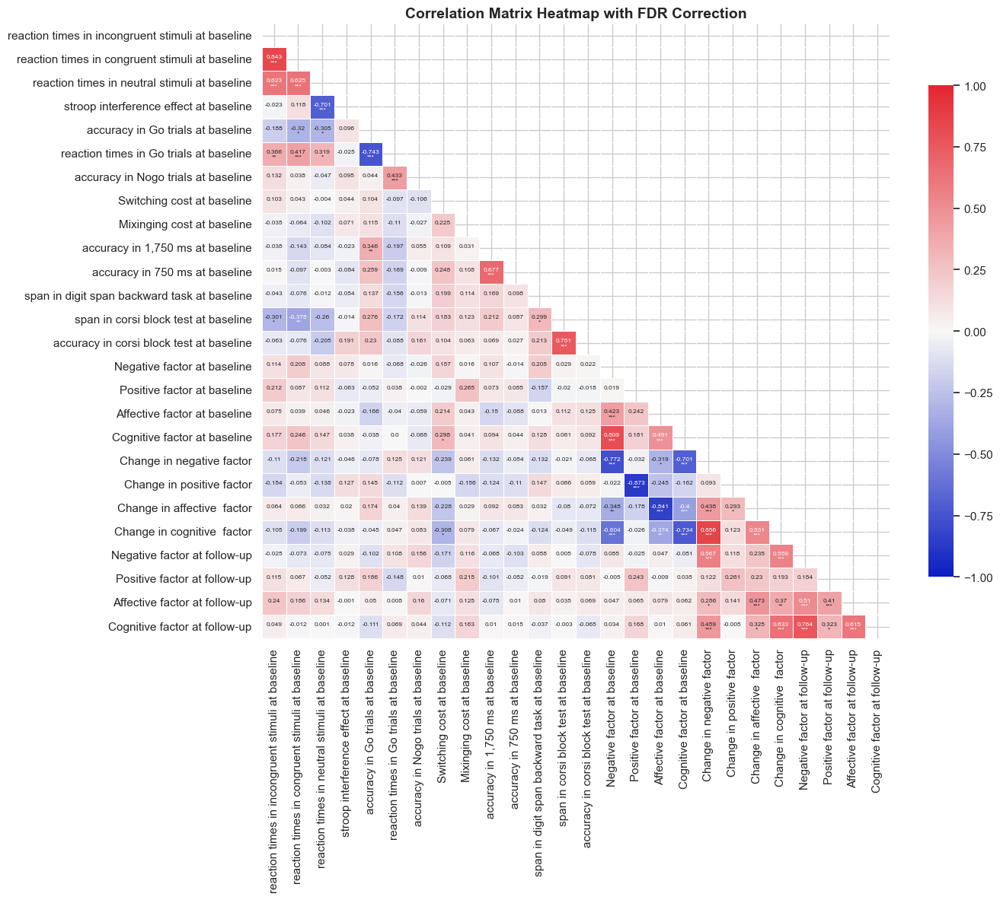

In [88]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(14,12))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/预后-分开fdr-执行功能与PANSS四维-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

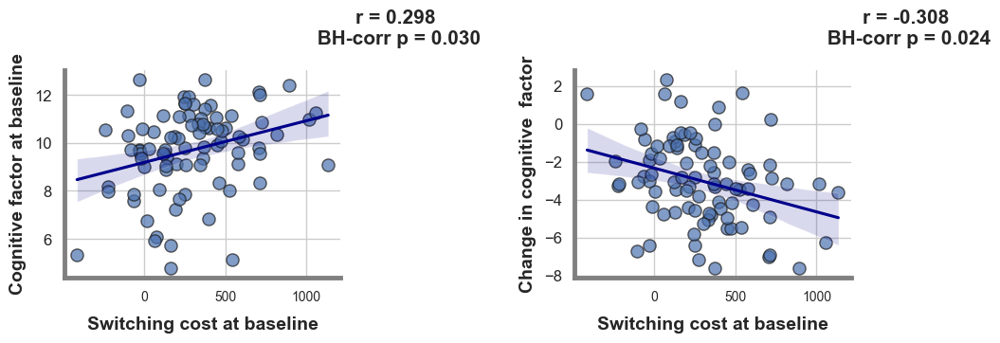

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest =  ['Negative factor at follow-up',
       'Positive factor at follow-up', 'Affective factor at follow-up',
       'Cognitive factor at follow-up',
  'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline','Change in negative factor',
       'Change in positive factor', 'Change in affective  factor',
       'Change in cognitive  factor']

significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

num_plots = len(variables_of_interest) * len(significant_vars)
num_rows = 5  

fig, axes = plt.subplots(num_rows, 4, figsize=(20, num_rows * 3))  
axes = axes.flatten()
plot_idx = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        paired_data = data[[var2, var1]].dropna()

        corrected_p = pval_corr_matrix.loc[var1, var2]
        if corrected_p < 0.05:
            ax = axes[plot_idx]
            plot_idx += 1
            sns.regplot(
                x=paired_data[var1], 
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'}, 
                line_kws={'color': 'darkblue'}, 
                ci=95,  
                ax=ax  
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2]) 
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"

            xpos = 1.2
            ypos = 1.2

            ax.text(xpos, ypos, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=6)
            ax.set_xlabel(f"{var1}", fontsize=14, weight='bold', labelpad=10)

            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)

            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

for i in range(plot_idx, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.savefig("./results/预后-分开fdr-执行功能与PANSS四维-fdr-散点图.jpg", dpi=600, bbox_inches='tight')
plt.show()

### 2.整个FDR

In [90]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

df = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

continuous_columns = ['reaction times in incongruent stimuli at baseline', 'reaction times in congruent stimuli at baseline', 'reaction times in neutral stimuli at baseline', 'stroop interference effect at baseline', 'accuracy in Go trials at baseline', 'reaction times in Go trials at baseline', 'accuracy in Nogo trials at baseline', 'Switching cost at baseline', 'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline', 'accuracy in 750 ms at baseline', 'span in digit span backward task at baseline', 'span in corsi block test at baseline', 'accuracy in corsi block test at baseline',                
      'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline',
      'Change in negative factor',
       'Change in positive factor', 'Change in affective  factor',
       'Change in cognitive  factor', 'Negative factor at follow-up',
       'Positive factor at follow-up', 'Affective factor at follow-up',
       'Cognitive factor at follow-up']

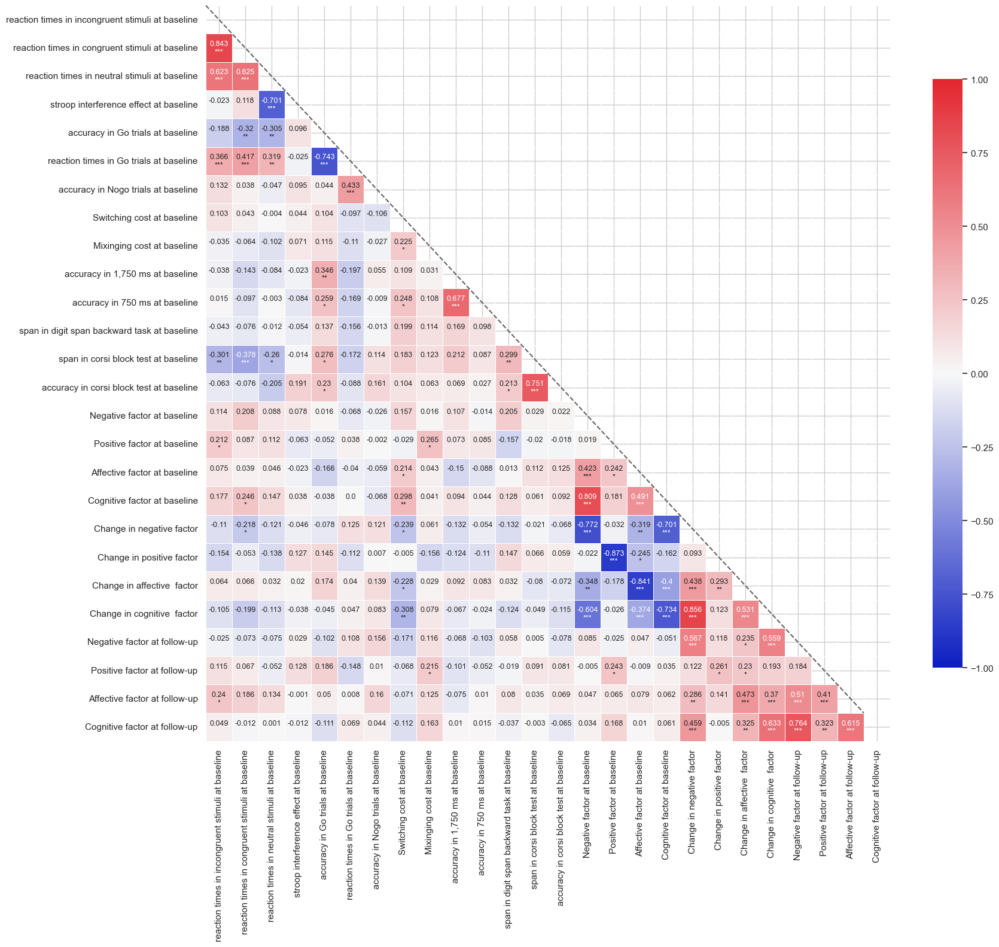

In [91]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(18, 16))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()

def color_labels(labels):
    for label in labels:
        text = label.get_text()

        if text in ['Baseline_Negative', 'Baseline_Positive', 'Baseline_Affective', 'Baseline_Cognitive']:
            label.set_color('#E0341A') 
        elif text in ['change_Negative', 'change__Positive', 'change__Affective', 'change__Cognitive']:
            label.set_color('#F67737')  

color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/预后执行功能、血液与临床的相关.jpg", dpi=100, bbox_inches='tight')
plt.show()

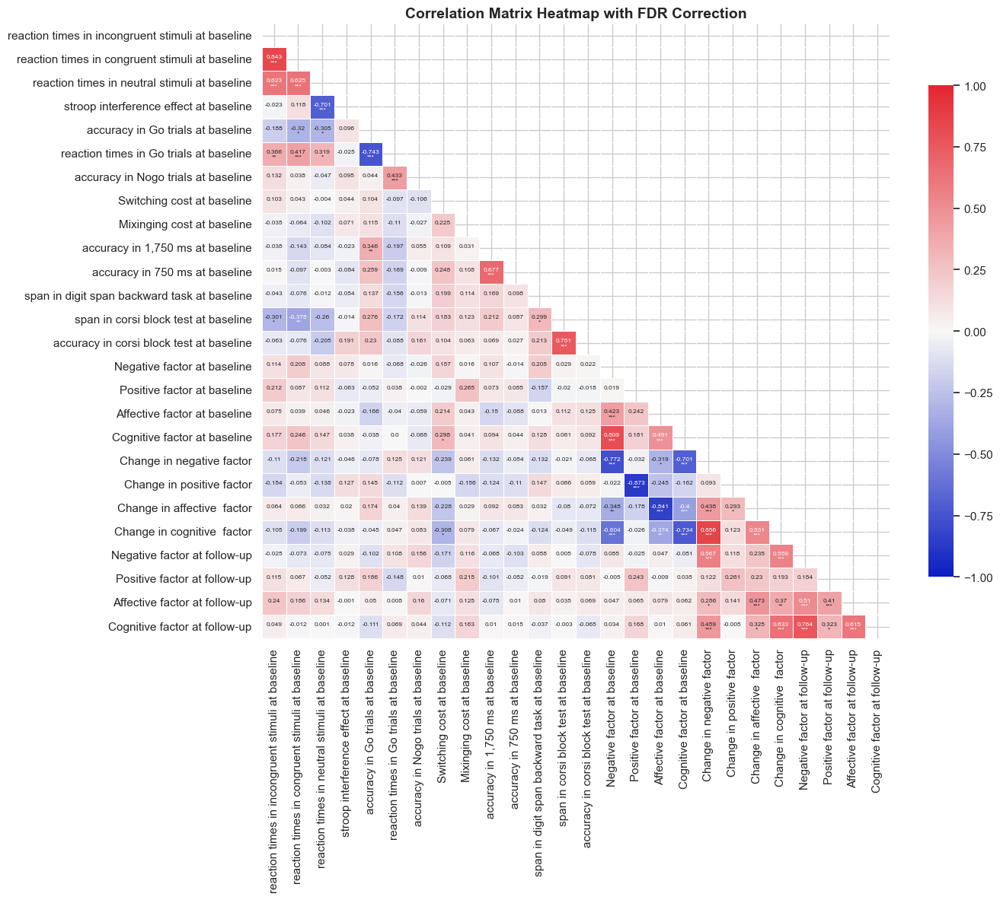

In [92]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/预后执行功能、血液与临床的相关_FDR.jpg", dpi=100, bbox_inches='tight')
plt.show()

#### 与临床

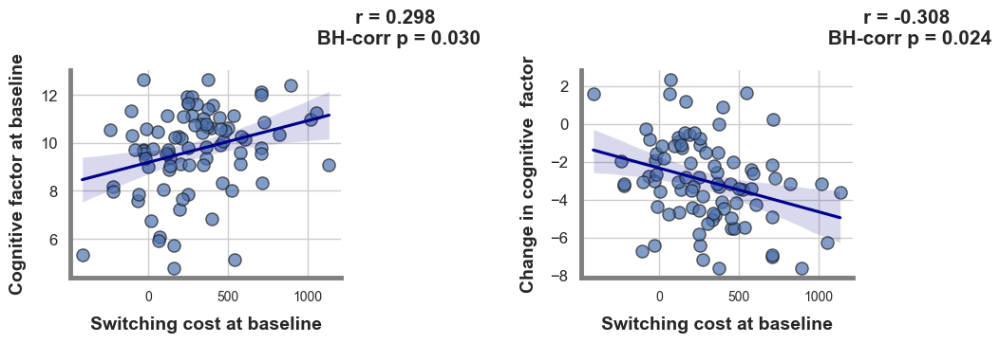

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest =  ['Negative factor at follow-up',
       'Positive factor at follow-up', 'Affective factor at follow-up',
       'Cognitive factor at follow-up',
  'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline',
       'Change in negative factor',
       'Change in positive factor', 'Change in affective  factor',
       'Change in cognitive  factor']

significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

num_plots = len(variables_of_interest) * len(significant_vars)
num_rows = 5  

fig, axes = plt.subplots(num_rows, 4, figsize=(20, num_rows * 3))  
axes = axes.flatten()
plot_idx = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        paired_data = data[[var2, var1]].dropna()

        corrected_p = pval_corr_matrix.loc[var1, var2]
        if corrected_p < 0.05:
            ax = axes[plot_idx]
            plot_idx += 1
            sns.regplot(
                x=paired_data[var1], 
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'}, 
                line_kws={'color': 'darkblue'}, 
                ci=95,  
                ax=ax  
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2]) 
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"

            xpos = 1.2
            ypos = 1.2

            ax.text(xpos, ypos, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(f"{var1}", fontsize=14, weight='bold', labelpad=10)

            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)

            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

for i in range(plot_idx, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.savefig("./results/散点图-预后执行功能=与临床的相关-血液相关_FDR-与临床.jpg", dpi=600, bbox_inches='tight')
plt.show()

## 2.补充2： 86人执行功能与PANSS相关分析（无FDR）

In [94]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

df = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

continuous_columns = ['reaction times in incongruent stimuli at baseline', 'reaction times in congruent stimuli at baseline', 'reaction times in neutral stimuli at baseline', 'stroop interference effect at baseline', 'accuracy in Go trials at baseline', 'reaction times in Go trials at baseline', 'accuracy in Nogo trials at baseline', 'Switching cost at baseline', 'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline', 'accuracy in 750 ms at baseline', 'span in digit span backward task at baseline', 'span in corsi block test at baseline', 'accuracy in corsi block test at baseline',                
      'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline',
       'Change in negative factor',
       'Change in positive factor', 'Change in affective  factor',
       'Change in cognitive  factor', 'Negative factor at follow-up',
       'Positive factor at follow-up', 'Affective factor at follow-up',
       'Cognitive factor at follow-up']



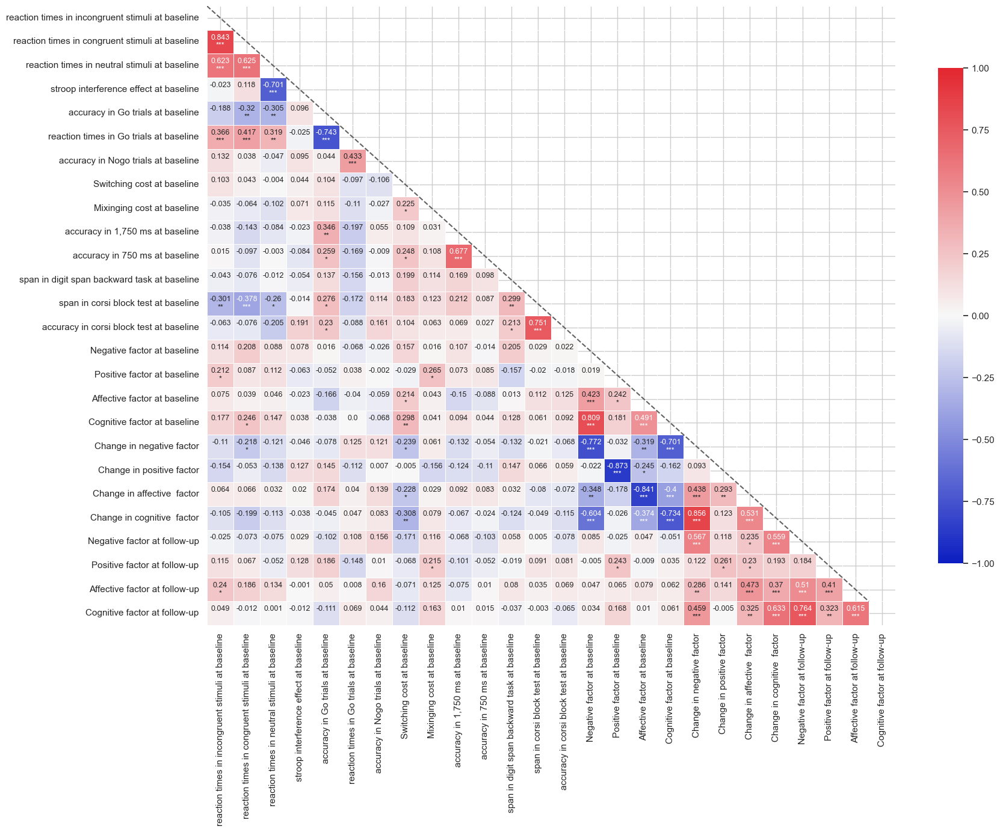

In [95]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(18, 14))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()

def color_labels(labels):
    for label in labels:
        text = label.get_text()

        if text in ['Baseline_Negative', 'Baseline_Positive', 'Baseline_Affective', 'Baseline_Cognitive']:
            label.set_color('#E0341A') 
        elif text in ['change_Negative', 'change__Positive', 'change__Affective', 'change__Cognitive']:
            label.set_color('#F67737')  

color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/预后执行功能、血液与临床的相关.jpg", dpi=100, bbox_inches='tight')
plt.show()

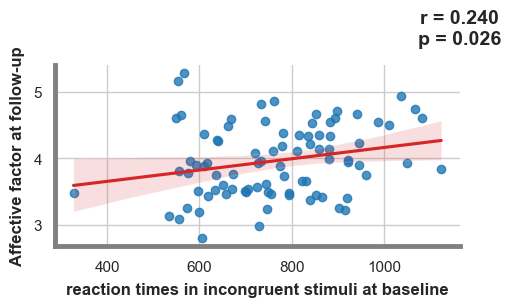

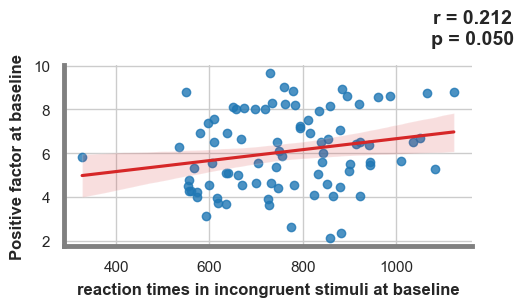

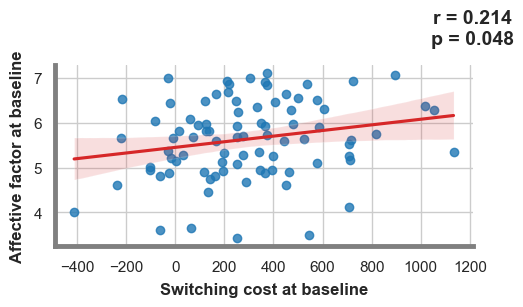

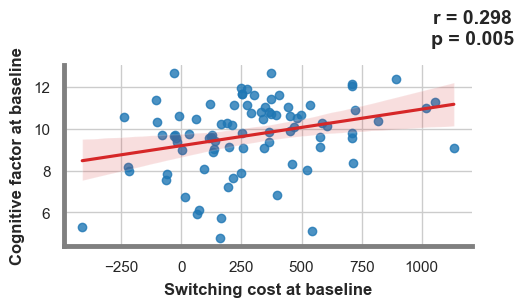

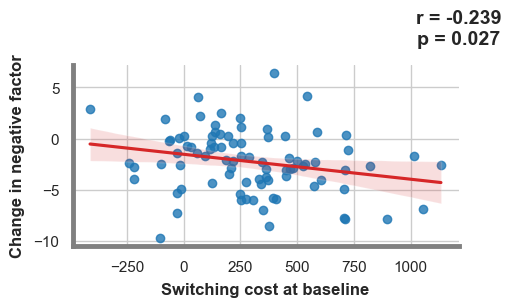

...

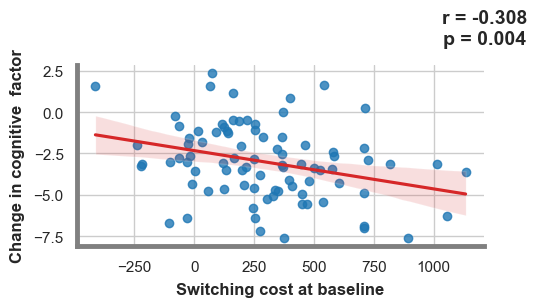

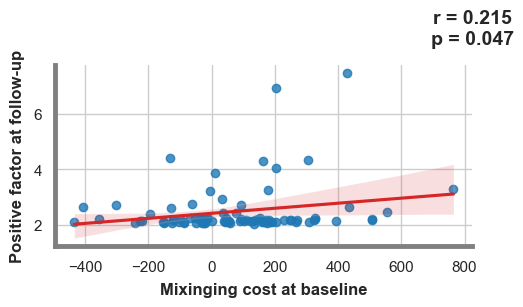

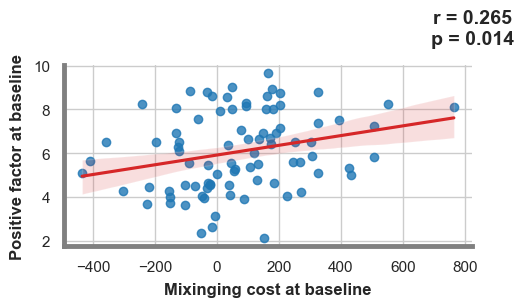

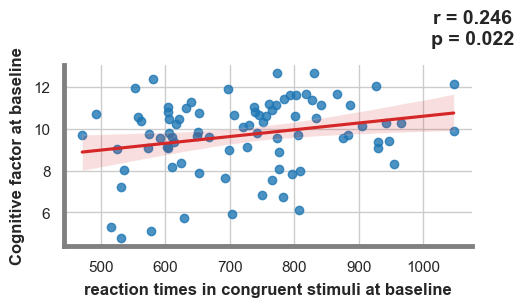

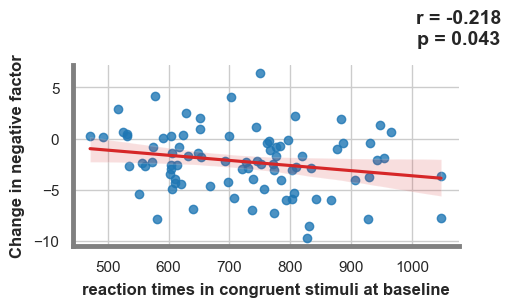

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

variables_of_interest =  ['Negative factor at follow-up',
       'Positive factor at follow-up', 'Affective factor at follow-up',
       'Cognitive factor at follow-up',
  'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline',
       'Change in negative factor',
       'Change in positive factor', 'Change in affective  factor',
       'Change in cognitive  factor']

significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pvalues.loc[(pvalues[var.replace('\n', ' ')] < 0.05) & (pvalues.index != var.replace('\n', ' ')), var.replace('\n', ' ')].index.tolist())

significant_vars = list(set(significant_vars) - set([var.replace('\n', ' ') for var in variables_of_interest]))

blue_hex = "#1f77b4"
red_hex = "#d62728"
grey_hex = "#808080"

for var1 in significant_vars:
    for var2 in variables_of_interest:
        if pvalues.loc[var1, var2.replace('\n', ' ')] < 0.05:
            plt.figure(figsize=(5.4, 3.4))

            sns.regplot(x=data[var1], y=data[var2.replace('\n', ' ')], line_kws={'color': red_hex}, scatter_kws={'color': blue_hex}, ci=95)

            r, p = pearsonr(data[var1], data[var2.replace('\n', ' ')])
            xpos = 1.0
            ypos = 1.2
            plt.text(xpos, ypos, f'r = {r:.3f}\np = {p:.3f}', fontsize=14, weight='bold', ha='center', va='center', transform=plt.gca().transAxes)

            plt.xlabel(var1, fontsize=12, weight='bold', labelpad=6)
            plt.ylabel(var2, fontsize=12, weight='bold', labelpad=6)


            ax = plt.gca()
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color(grey_hex)
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color(grey_hex)


            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

            plt.tight_layout()
            plt.savefig(f"./results/{var1}_vs预后患者EF-PANSS无FDR_{var2.replace(' ', '_').replace('_', '_')}.jpg", dpi=600, bbox_inches='tight')
            plt.show()

# 3.全部完成

In [97]:
print("Sucess!")

Sucess!


# 4.奥氮平当量和PANSS、EF的联系

## 4.1 奥氮平当量和PANSS的联系（86人）

In [98]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

df = pd.read_excel('./rawdata/奥氮平当量和PANSS、EF的联系.xlsx', sheet_name="86")

print(df.columns)



Index(['ID', 'Group', 'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline', 'Dose Equivalent to Olanzapine',
       'reaction times in incongruent stimuli at baseline',
       'reaction times in congruent stimuli at baseline',
       'reaction times in neutral stimuli at baseline',
       'stroop interference effect at baseline',
       'accuracy in Go trials at baseline',
       'reaction times in Go trials at baseline',
       'accuracy in Nogo trials at baseline', 'Switching cost at baseline',
       'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline',
       'accuracy in 750 ms at baseline',
       'span in digit span backward task at baseline',
       'span in corsi block test at baseline',
       'accuracy in corsi block test at baseline',
       'Inhibition Factor at baseline',
       'Executive Function Factor at baseline',
       'Inhibition and Updating Factor at baseline',
    

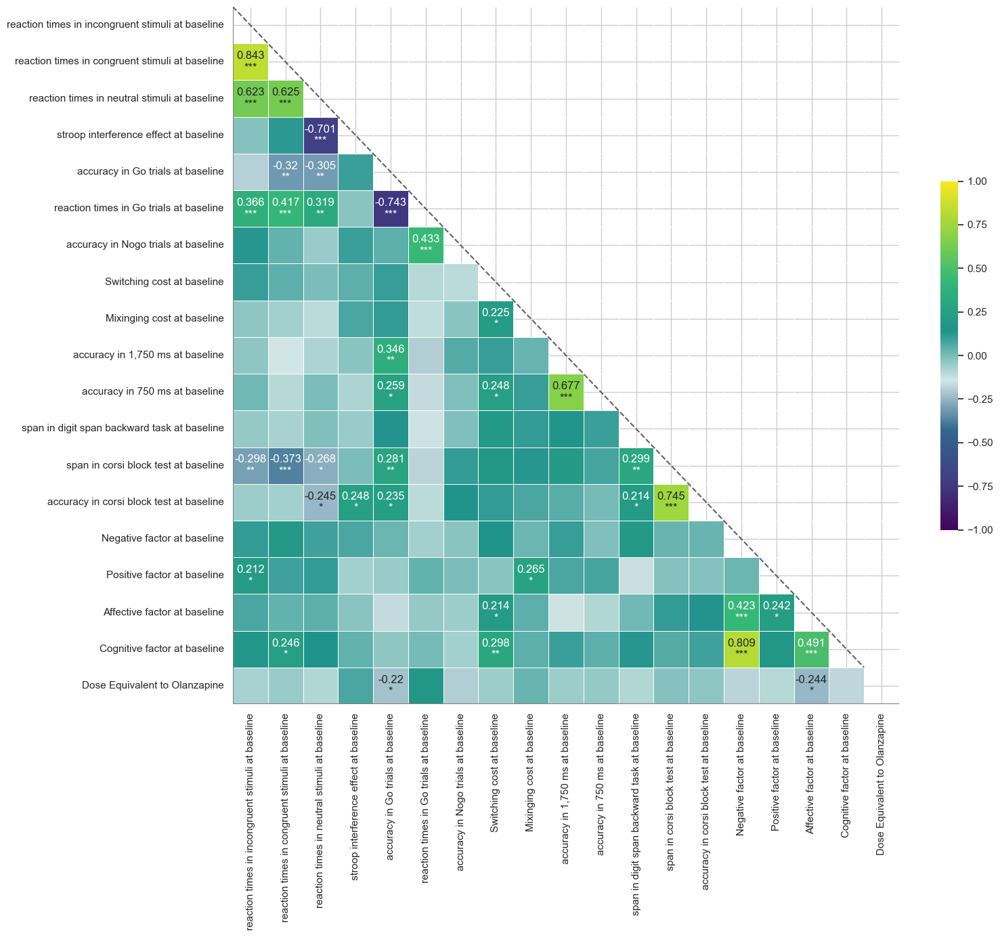

In [99]:



continuous_columns = ['reaction times in incongruent stimuli at baseline', 'reaction times in congruent stimuli at baseline', 'reaction times in neutral stimuli at baseline', 'stroop interference effect at baseline', 'accuracy in Go trials at baseline', 'reaction times in Go trials at baseline', 'accuracy in Nogo trials at baseline', 'Switching cost at baseline', 'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline', 'accuracy in 750 ms at baseline', 'span in digit span backward task at baseline', 'span in corsi block test at baseline', 'accuracy in corsi block test at baseline',                
      'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline', 'Dose Equivalent to Olanzapine']


import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr, chi2_contingency
import pandas as pd

rgb_colors = [
    (68, 4, 90),
    (65, 62, 133),
    (48, 104, 141),
    (210, 230, 230),  
    (31, 146, 139),
    (53, 183, 119),
    (145, 213, 66),
    (248, 230, 32)
]

hex_colors = ['#' + ''.join(['{:02x}'.format(val) for val in color]) for color in rgb_colors]

cmap = LinearSegmentedColormap.from_list("Custom", hex_colors, N=256)

corr = df[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(df[continuous_columns])

def significance_level(pval):
    if pval < 0.001:
        return '***'
    elif pval < 0.01:
        return '**' 
    elif pval < 0.05:
        return '*'
    else:
        return ''

labels_corr = np.where((pvalues < 0.05), corr.round(3).astype(str), '')
labels_p = np.where((pvalues < 0.05), pvalues.applymap(significance_level), '')
labels = np.where((pvalues < 0.05), labels_corr + '\n' + labels_p, '')

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)
fig, ax = plt.subplots(figsize=(16, 14))

sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .5}, vmin=-1, vmax=1, annot_kws={"size": 12})

ax.axhline(y=len(corr), color='grey', linewidth=1.5)

ax.plot([0, 0], [0, len(corr)], color='grey', linewidth=1.5)

xticklabels = ax.get_xticklabels()
for label in xticklabels:
    text = label.get_text()
    if text in ['PANSS_Negative', 'PANSS_Positive', 'PANSS_Affective', 'PANSS_Cognitive']:
        label.set_color('red')
        label.set_weight('bold')
ax.set_xticklabels(xticklabels)

yticklabels = ax.get_yticklabels()
for label in yticklabels:
    text = label.get_text()
    if text in ['PANSS_Negative', 'PANSS_Positive', 'PANSS_Affective', 'PANSS_Cognitive']:
        label.set_color('red')
        label.set_weight('bold')
ax.set_yticklabels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/奥氮平当量和PANSS的联系-86人.jpg", dpi=100, bbox_inches='tight')
plt.show()


In [100]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest = ['Dose Equivalent to Olanzapine']
significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pvalues.loc[(pvalues[var] < 0.05) & (pvalues.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

plots_per_figure = 4

total_plots = sum([len(pvalues.loc[(pvalues[var] < 0.05) & (pvalues.index != var), var].index.tolist()) for var in variables_of_interest])

significant_plot_count = 0

n_tests = pvalues.size
bonferroni_pvalues = pvalues * n_tests

for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = bonferroni_pvalues.loc[var1, var2]
        print(f"Corrected p-value for {var1} and {var2}: {corrected_p:.3f}")  # 打印所有校正后的P值
        
        if corrected_p < 0.05:
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-患者-社会人口与PANSS四维-bonferroni-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(24, 5))
                plt_idx = 0

            ax = axes[plt_idx % plots_per_figure]
            paired_data = df[[var2, var1]].dropna()

            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"

            ax.text(0.80, 1.05, f'r = {r:.3f}\n Bonferroni-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)

            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)

            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

            plt_idx += 1
            significant_plot_count += 1

if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout() 
    plt.savefig(f"./results/奥氮平当量和PANSS的联系-86人-bonferroni-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

Corrected p-value for Affective factor at baseline and Dose Equivalent to Olanzapine: 8.556
Corrected p-value for accuracy in Go trials at baseline and Dose Equivalent to Olanzapine: 15.198


Corrected p-value for Affective factor at baseline and Dose Equivalent to Olanzapine: 0.024
Corrected p-value for accuracy in Go trials at baseline and Dose Equivalent to Olanzapine: 0.042


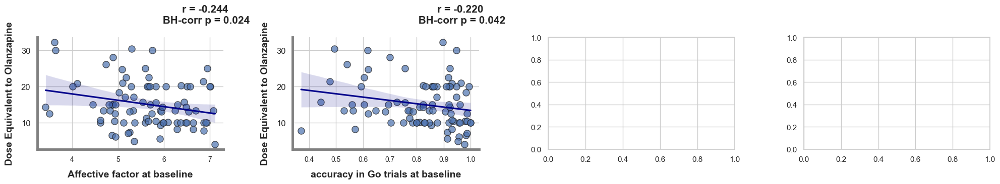

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest = ['Dose Equivalent to Olanzapine']
significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pvalues.loc[(pvalues[var] < 0.05) & (pvalues.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

plots_per_figure = 4 

total_plots = sum([len(pvalues.loc[(pvalues[var] < 0.05) & (pvalues.index != var), var].index.tolist()) for var in variables_of_interest])

significant_plot_count = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pvalues.loc[var1, var2]
        print(f"Corrected p-value for {var1} and {var2}: {corrected_p:.3f}")  # 打印校正后的P值
        
        if corrected_p < 0.05:
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-患者-社会人口与PANSS四维-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(20, 4))
                plt_idx = 0 
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = df[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(0.9, 1.2, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            
            plt_idx += 1  
            significant_plot_count += 1 

if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/奥氮平当量和PANSS的联系-86人-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

## 4.2 奥氮平当量和EF的联系（195人）

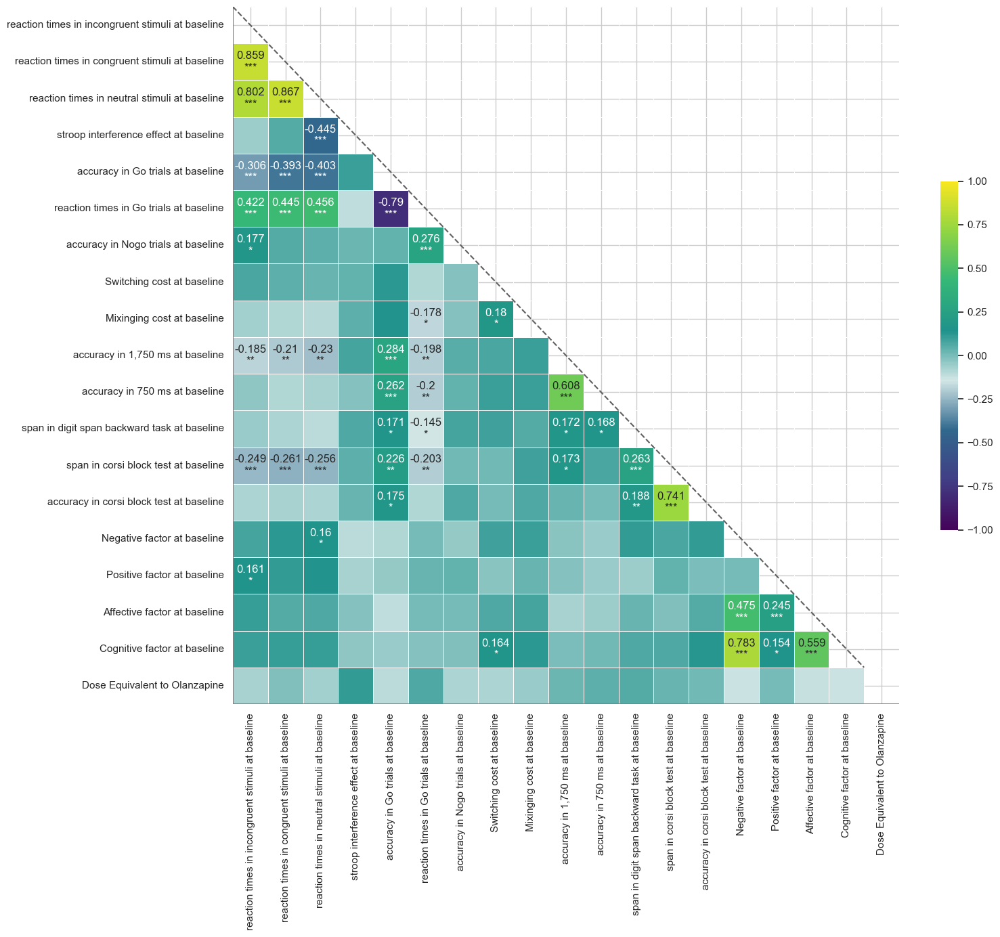

In [102]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

# 读取sheet 195

df = pd.read_excel('./rawdata/奥氮平当量和PANSS、EF的联系.xlsx', sheet_name="195")

continuous_columns = ['reaction times in incongruent stimuli at baseline', 'reaction times in congruent stimuli at baseline', 'reaction times in neutral stimuli at baseline', 'stroop interference effect at baseline', 'accuracy in Go trials at baseline', 'reaction times in Go trials at baseline', 'accuracy in Nogo trials at baseline', 'Switching cost at baseline', 'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline', 'accuracy in 750 ms at baseline', 'span in digit span backward task at baseline', 'span in corsi block test at baseline', 'accuracy in corsi block test at baseline',                
      'Negative factor at baseline',
       'Positive factor at baseline', 'Affective factor at baseline',
       'Cognitive factor at baseline', 'Dose Equivalent to Olanzapine']


import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr, chi2_contingency
import pandas as pd

rgb_colors = [
    (68, 4, 90),
    (65, 62, 133),
    (48, 104, 141),
    (210, 230, 230),  
    (31, 146, 139),
    (53, 183, 119),
    (145, 213, 66),
    (248, 230, 32)
]

hex_colors = ['#' + ''.join(['{:02x}'.format(val) for val in color]) for color in rgb_colors]

cmap = LinearSegmentedColormap.from_list("Custom", hex_colors, N=256)

corr = df[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(df[continuous_columns])

def significance_level(pval):
    if pval < 0.001:
        return '***'
    elif pval < 0.01:
        return '**' 
    elif pval < 0.05:
        return '*'
    else:
        return ''

labels_corr = np.where((pvalues < 0.05), corr.round(3).astype(str), '')
labels_p = np.where((pvalues < 0.05), pvalues.applymap(significance_level), '')
labels = np.where((pvalues < 0.05), labels_corr + '\n' + labels_p, '')

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)
fig, ax = plt.subplots(figsize=(16, 14))

sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .5}, vmin=-1, vmax=1, annot_kws={"size": 12})

ax.axhline(y=len(corr), color='grey', linewidth=1.5)

ax.plot([0, 0], [0, len(corr)], color='grey', linewidth=1.5)

xticklabels = ax.get_xticklabels()
for label in xticklabels:
    text = label.get_text()
    if text in ['PANSS_Negative', 'PANSS_Positive', 'PANSS_Affective', 'PANSS_Cognitive']:
        label.set_color('red')
        label.set_weight('bold')
ax.set_xticklabels(xticklabels)

yticklabels = ax.get_yticklabels()
for label in yticklabels:
    text = label.get_text()
    if text in ['PANSS_Negative', 'PANSS_Positive', 'PANSS_Affective', 'PANSS_Cognitive']:
        label.set_color('red')
        label.set_weight('bold')
ax.set_yticklabels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/奥氮平当量和PANSS的联系-195人.jpg", dpi=100, bbox_inches='tight')
plt.show()


In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest = ['Dose Equivalent to Olanzapine']
significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pvalues.loc[(pvalues[var] < 0.05) & (pvalues.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

plots_per_figure = 4 

total_plots = sum([len(pvalues.loc[(pvalues[var] < 0.05) & (pvalues.index != var), var].index.tolist()) for var in variables_of_interest])

significant_plot_count = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pvalues.loc[var1, var2]

        if corrected_p < 0.05:
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    plt.tight_layout()
                    plt.savefig(f"./results/奥氮平当量和PANSS的联系-195人-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(24, 5))
                plt_idx = 0 
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = df[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(0.80, 1.05, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

            plt_idx += 1  
            significant_plot_count += 1 

if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/奥氮平当量和PANSS的联系-195人-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

In [104]:
print("全部完成！")

全部完成！
